# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 11s 1us/step


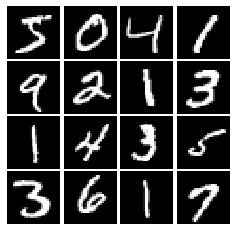

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, x * alpha)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [7]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform((batch_size, dim), minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [8]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [24]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,), activation=lambda x: leaky_relu(x, alpha=0.01)),
        tf.keras.layers.Dense(256, activation=lambda x: leaky_relu(x, alpha=0.01)),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [25]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [43]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """

    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [44]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [65]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(logits_real), logits_real) + \
           tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones(tf.shape(logits_fake)), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [66]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [60]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [67]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.5)
    G_solver = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.5)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [132]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 0.9928, G:0.708
Instructions for updating:
Use tf.identity instead.


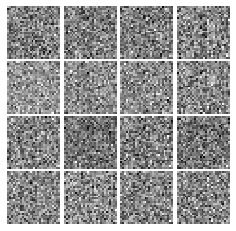

Epoch: 0, Iter: 20, D: 0.5857, G:0.9642


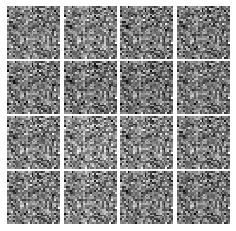

Epoch: 0, Iter: 40, D: 0.3407, G:1.363


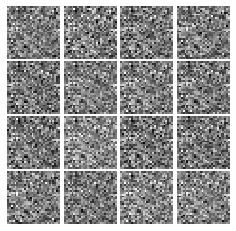

Epoch: 0, Iter: 60, D: 0.07035, G:3.399


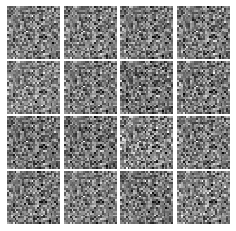

Epoch: 0, Iter: 80, D: 2.695, G:1.828


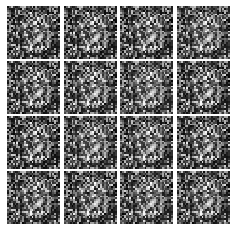

Epoch: 0, Iter: 100, D: 1.18, G:1.184


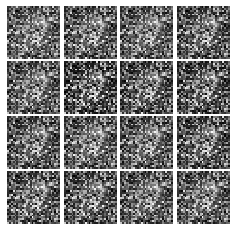

Epoch: 0, Iter: 120, D: 1.429, G:1.973


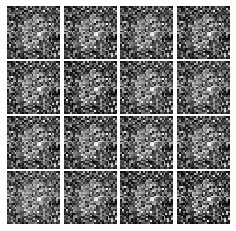

Epoch: 0, Iter: 140, D: 1.707, G:1.756


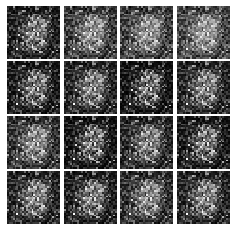

Epoch: 0, Iter: 160, D: 1.803, G:0.7163


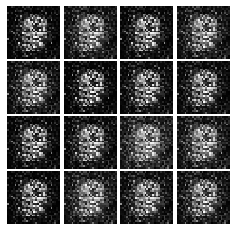

Epoch: 0, Iter: 180, D: 1.286, G:1.034


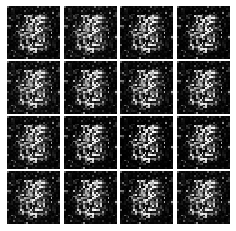

Epoch: 0, Iter: 200, D: 1.246, G:1.259


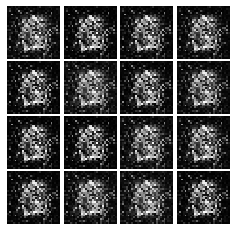

Epoch: 0, Iter: 220, D: 0.9395, G:1.116


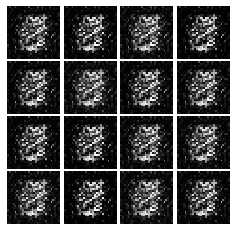

Epoch: 0, Iter: 240, D: 0.7908, G:1.63


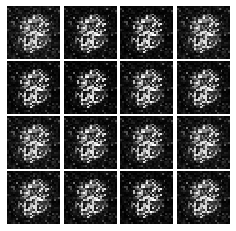

Epoch: 0, Iter: 260, D: 1.293, G:1.194


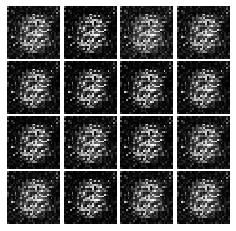

Epoch: 0, Iter: 280, D: 1.829, G:0.7644


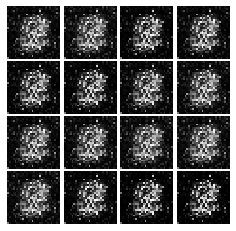

Epoch: 0, Iter: 300, D: 1.178, G:1.306


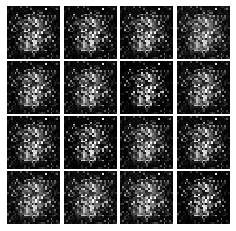

Epoch: 0, Iter: 320, D: 1.151, G:1.471


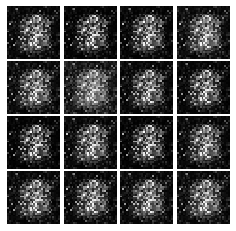

Epoch: 0, Iter: 340, D: 0.8355, G:1.813


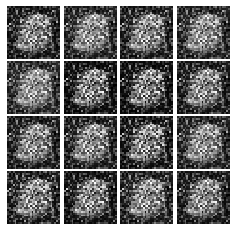

Epoch: 0, Iter: 360, D: 2.818, G:0.6658


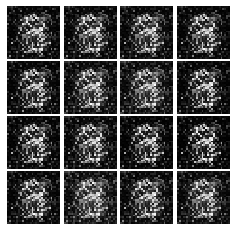

Epoch: 0, Iter: 380, D: 1.113, G:1.43


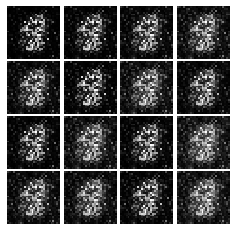

Epoch: 0, Iter: 400, D: 1.35, G:1.087


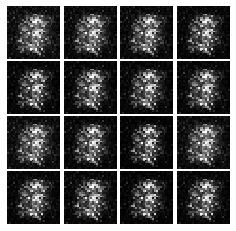

Epoch: 0, Iter: 420, D: 1.031, G:1.308


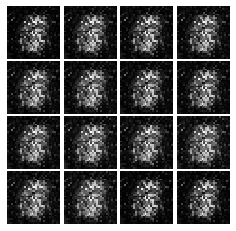

Epoch: 0, Iter: 440, D: 1.092, G:1.061


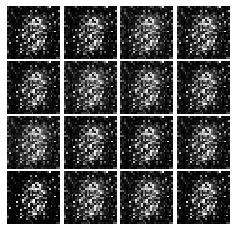

Epoch: 0, Iter: 460, D: 1.027, G:1.107


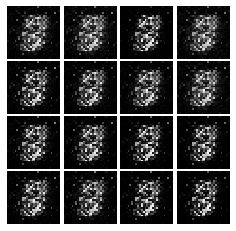

Epoch: 1, Iter: 480, D: 1.137, G:0.8211


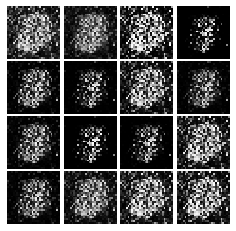

Epoch: 1, Iter: 500, D: 1.62, G:0.8634


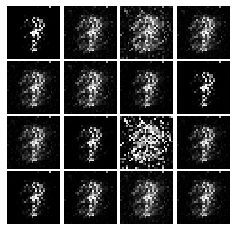

Epoch: 1, Iter: 520, D: 1.226, G:1.335


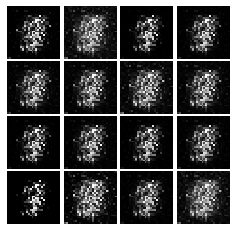

Epoch: 1, Iter: 540, D: 1.157, G:2.233


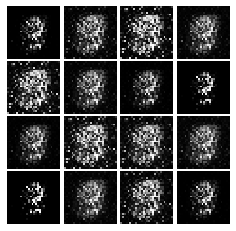

Epoch: 1, Iter: 560, D: 1.143, G:1.299


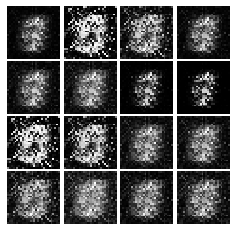

Epoch: 1, Iter: 580, D: 1.05, G:1.213


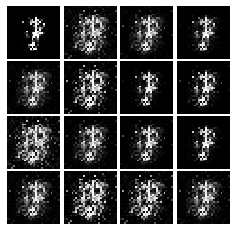

Epoch: 1, Iter: 600, D: 0.8374, G:1.112


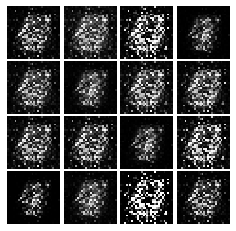

Epoch: 1, Iter: 620, D: 0.9423, G:1.401


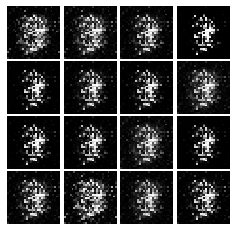

Epoch: 1, Iter: 640, D: 0.8801, G:1.852


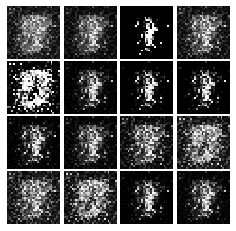

Epoch: 1, Iter: 660, D: 1.148, G:0.7032


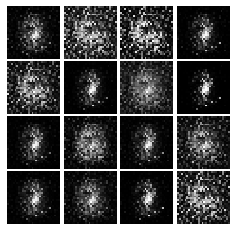

Epoch: 1, Iter: 680, D: 1.163, G:1.309


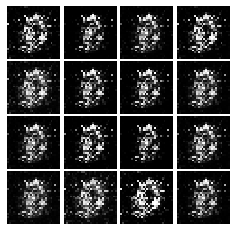

Epoch: 1, Iter: 700, D: 1.062, G:1.323


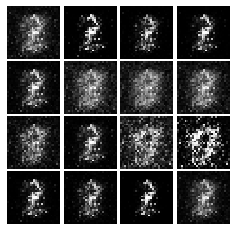

Epoch: 1, Iter: 720, D: 1.391, G:1.264


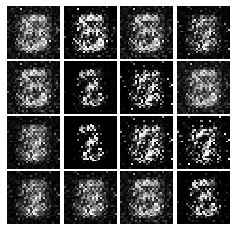

Epoch: 1, Iter: 740, D: 1.256, G:1.168


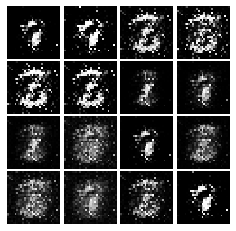

Epoch: 1, Iter: 760, D: 1.352, G:1.218


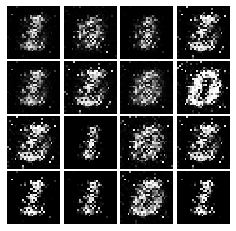

Epoch: 1, Iter: 780, D: 1.45, G:0.8501


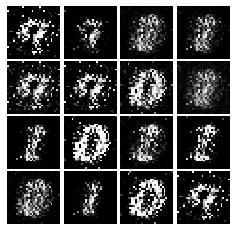

Epoch: 1, Iter: 800, D: 1.816, G:1.766


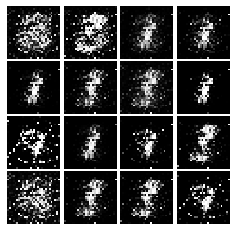

Epoch: 1, Iter: 820, D: 1.275, G:0.9501


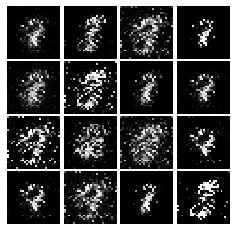

Epoch: 1, Iter: 840, D: 1.176, G:1.665


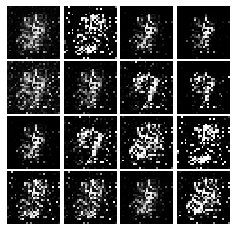

Epoch: 1, Iter: 860, D: 1.357, G:1.036


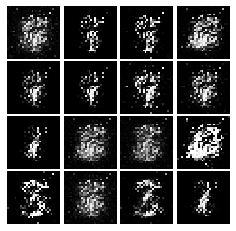

Epoch: 1, Iter: 880, D: 0.9742, G:2.129


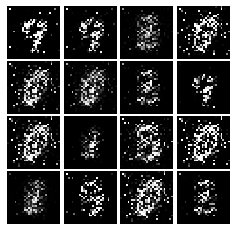

Epoch: 1, Iter: 900, D: 1.426, G:3.139


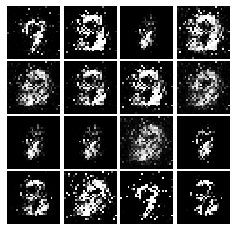

Epoch: 1, Iter: 920, D: 1.41, G:1.073


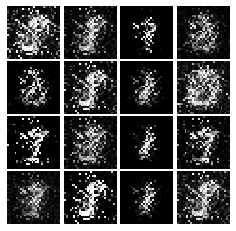

Epoch: 2, Iter: 940, D: 1.179, G:1.695


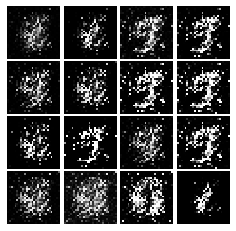

Epoch: 2, Iter: 960, D: 1.644, G:1.267


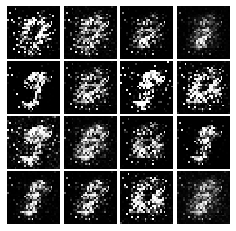

Epoch: 2, Iter: 980, D: 0.9775, G:1.783


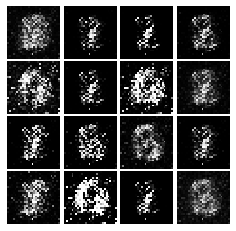

Epoch: 2, Iter: 1000, D: 1.293, G:1.048


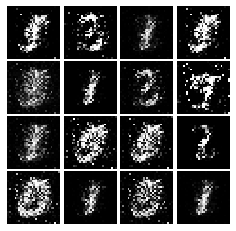

Epoch: 2, Iter: 1020, D: 1.323, G:0.8732


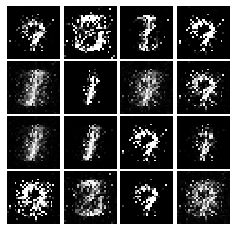

Epoch: 2, Iter: 1040, D: 1.266, G:1.266


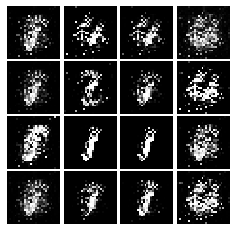

Epoch: 2, Iter: 1060, D: 1.683, G:0.6001


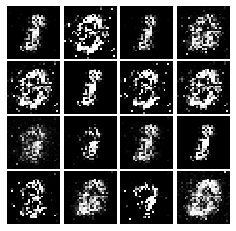

Epoch: 2, Iter: 1080, D: 1.387, G:1.634


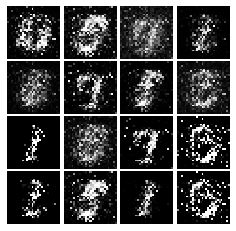

Epoch: 2, Iter: 1100, D: 1.171, G:1.248


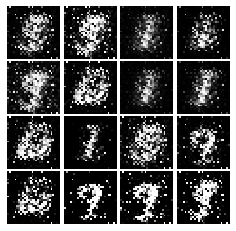

Epoch: 2, Iter: 1120, D: 1.077, G:1.554


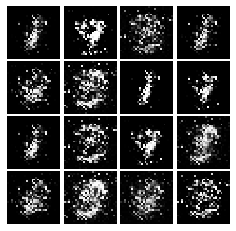

Epoch: 2, Iter: 1140, D: 1.158, G:0.2969


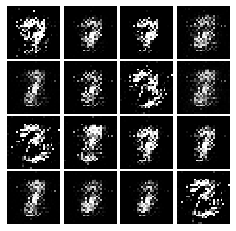

Epoch: 2, Iter: 1160, D: 1.006, G:1.256


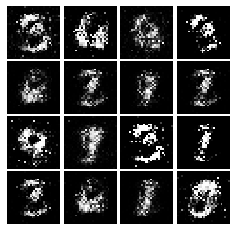

Epoch: 2, Iter: 1180, D: 1.159, G:1.319


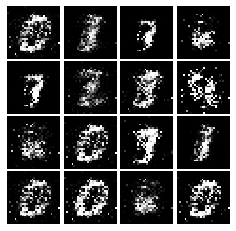

Epoch: 2, Iter: 1200, D: 1.177, G:1.175


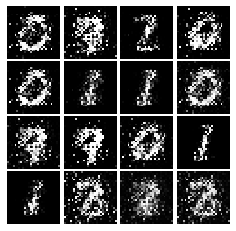

Epoch: 2, Iter: 1220, D: 0.9328, G:1.676


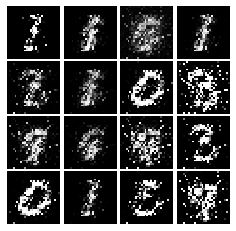

Epoch: 2, Iter: 1240, D: 1.288, G:1.138


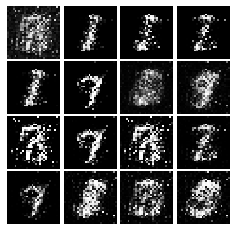

Epoch: 2, Iter: 1260, D: 1.18, G:1.158


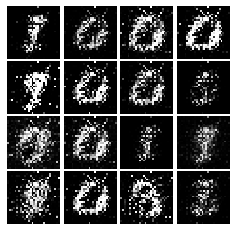

Epoch: 2, Iter: 1280, D: 1.423, G:1.097


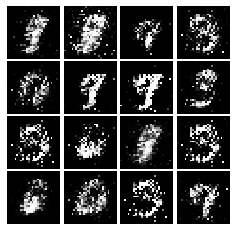

Epoch: 2, Iter: 1300, D: 1.076, G:1.318


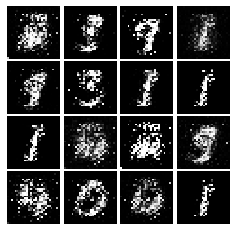

Epoch: 2, Iter: 1320, D: 1.139, G:1.332


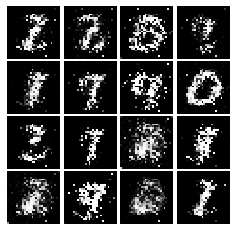

Epoch: 2, Iter: 1340, D: 1.148, G:1.491


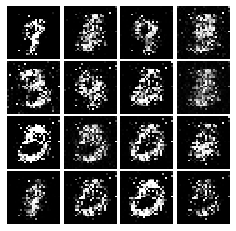

Epoch: 2, Iter: 1360, D: 1.28, G:1.087


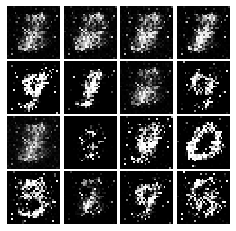

Epoch: 2, Iter: 1380, D: 1.297, G:1.037


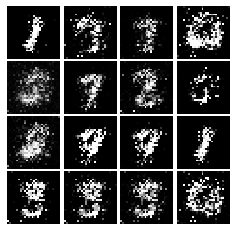

Epoch: 2, Iter: 1400, D: 1.273, G:1.114


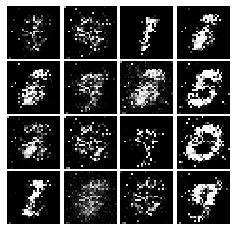

Epoch: 3, Iter: 1420, D: 1.334, G:1.105


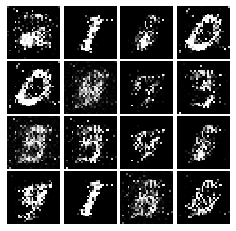

Epoch: 3, Iter: 1440, D: 1.083, G:1.175


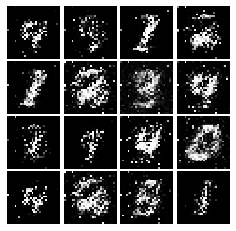

Epoch: 3, Iter: 1460, D: 1.995, G:0.05024


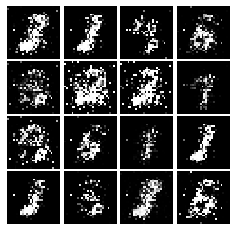

Epoch: 3, Iter: 1480, D: 1.404, G:2.245


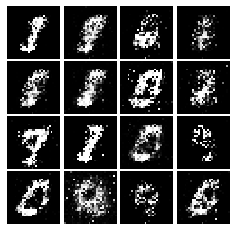

Epoch: 3, Iter: 1500, D: 1.182, G:1.135


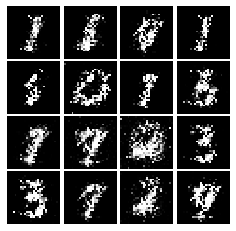

Epoch: 3, Iter: 1520, D: 1.042, G:1.351


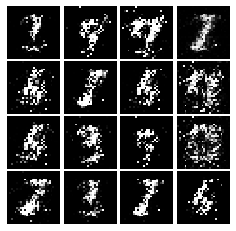

Epoch: 3, Iter: 1540, D: 1.278, G:0.4771


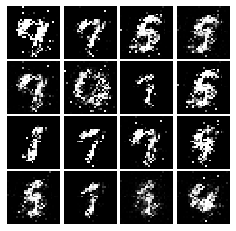

Epoch: 3, Iter: 1560, D: 1.06, G:1.167


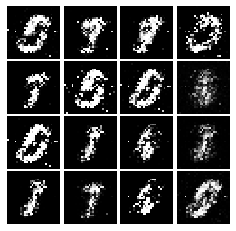

Epoch: 3, Iter: 1580, D: 1.68, G:1.482


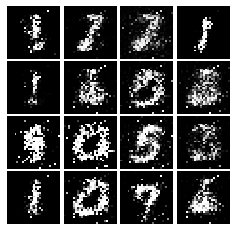

Epoch: 3, Iter: 1600, D: 1.424, G:1.084


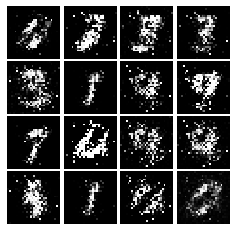

Epoch: 3, Iter: 1620, D: 1.302, G:1.243


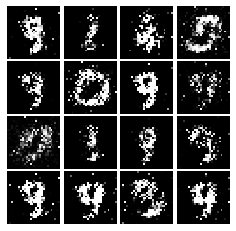

Epoch: 3, Iter: 1640, D: 1.409, G:0.3459


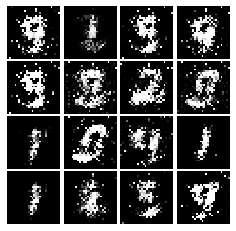

Epoch: 3, Iter: 1660, D: 1.259, G:1.106


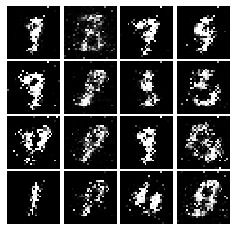

Epoch: 3, Iter: 1680, D: 1.227, G:0.9419


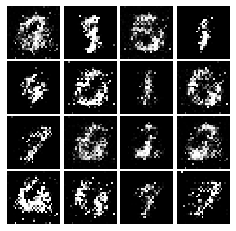

Epoch: 3, Iter: 1700, D: 1.466, G:1.044


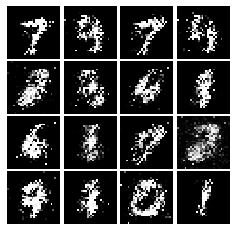

Epoch: 3, Iter: 1720, D: 1.371, G:1.244


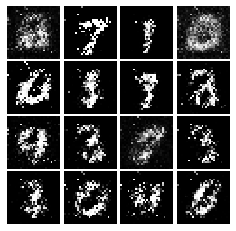

Epoch: 3, Iter: 1740, D: 1.28, G:1.122


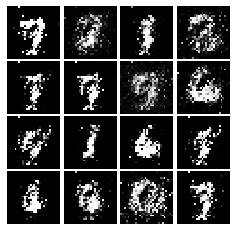

Epoch: 3, Iter: 1760, D: 1.228, G:1.003


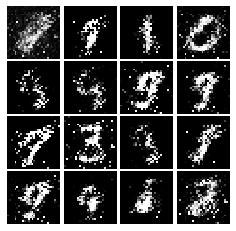

Epoch: 3, Iter: 1780, D: 1.257, G:1.095


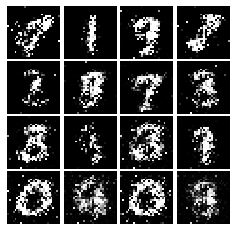

Epoch: 3, Iter: 1800, D: 1.305, G:1.086


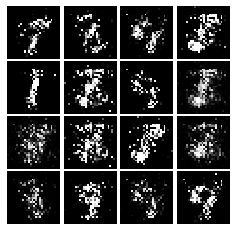

Epoch: 3, Iter: 1820, D: 1.352, G:1.102


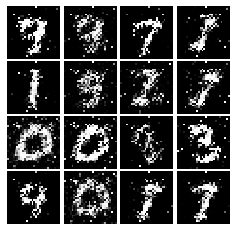

Epoch: 3, Iter: 1840, D: 1.315, G:0.9294


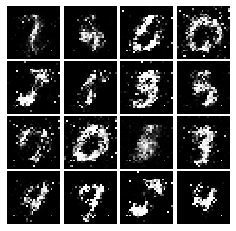

Epoch: 3, Iter: 1860, D: 1.213, G:1.05


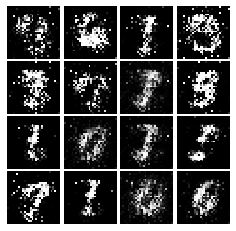

Epoch: 4, Iter: 1880, D: 1.262, G:1.191


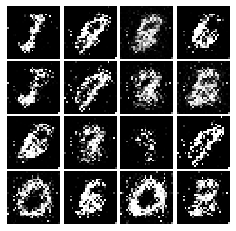

Epoch: 4, Iter: 1900, D: 1.329, G:0.9676


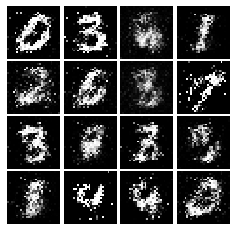

Epoch: 4, Iter: 1920, D: 1.285, G:1.002


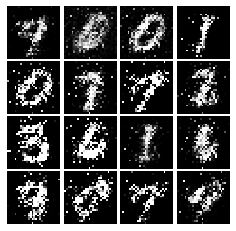

Epoch: 4, Iter: 1940, D: 1.369, G:0.9926


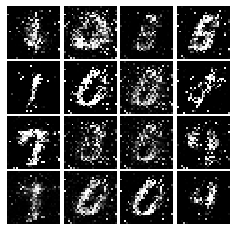

Epoch: 4, Iter: 1960, D: 1.311, G:1.275


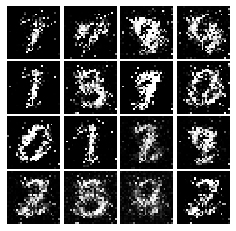

Epoch: 4, Iter: 1980, D: 1.274, G:0.957


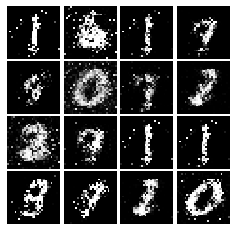

Epoch: 4, Iter: 2000, D: 1.311, G:0.8063


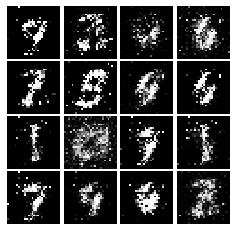

Epoch: 4, Iter: 2020, D: 1.192, G:1.314


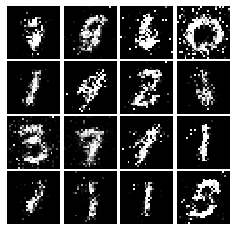

Epoch: 4, Iter: 2040, D: 1.39, G:0.8351


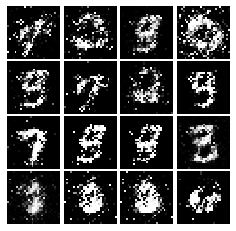

Epoch: 4, Iter: 2060, D: 1.359, G:0.9108


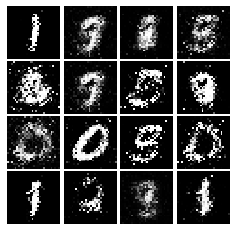

Epoch: 4, Iter: 2080, D: 1.284, G:0.8017


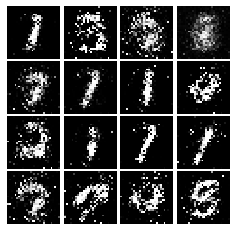

Epoch: 4, Iter: 2100, D: 1.386, G:0.8086


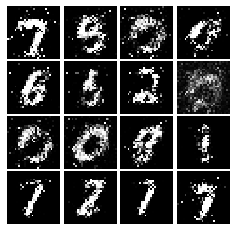

Epoch: 4, Iter: 2120, D: 1.398, G:0.6796


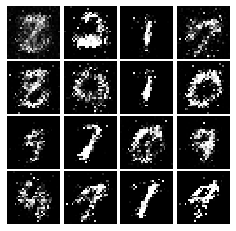

Epoch: 4, Iter: 2140, D: 1.299, G:0.8629


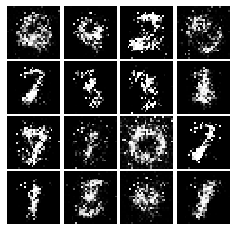

Epoch: 4, Iter: 2160, D: 1.272, G:0.898


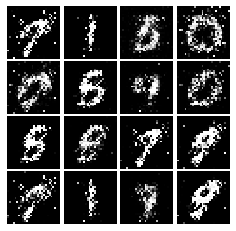

Epoch: 4, Iter: 2180, D: 1.385, G:0.8119


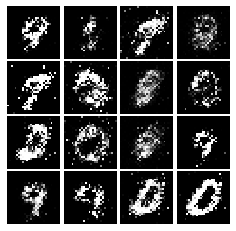

Epoch: 4, Iter: 2200, D: 1.318, G:0.8625


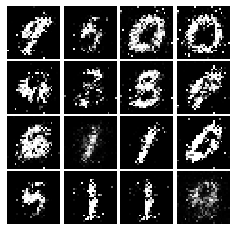

Epoch: 4, Iter: 2220, D: 1.491, G:0.9841


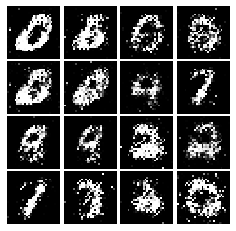

Epoch: 4, Iter: 2240, D: 1.383, G:0.7597


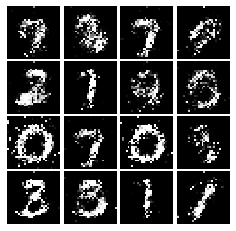

Epoch: 4, Iter: 2260, D: 1.252, G:0.9053


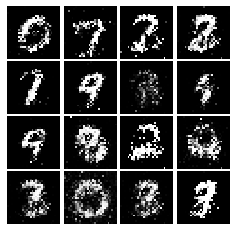

Epoch: 4, Iter: 2280, D: 1.073, G:1.096


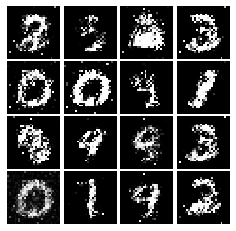

Epoch: 4, Iter: 2300, D: 1.201, G:0.8682


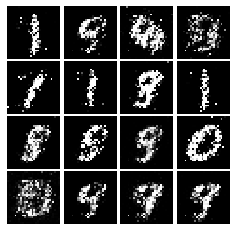

Epoch: 4, Iter: 2320, D: 1.316, G:0.7301


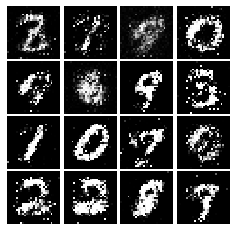

Epoch: 4, Iter: 2340, D: 1.225, G:1.147


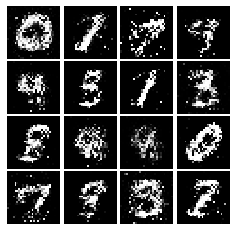

Epoch: 5, Iter: 2360, D: 1.379, G:0.7016


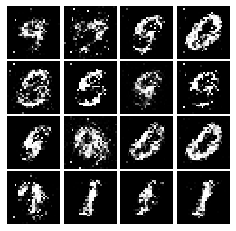

Epoch: 5, Iter: 2380, D: 1.359, G:0.8791


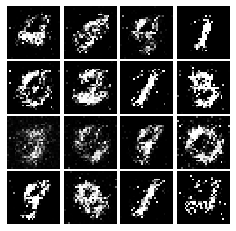

Epoch: 5, Iter: 2400, D: 1.248, G:1.024


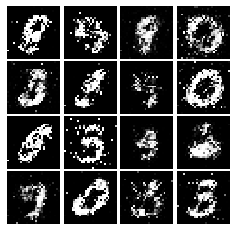

Epoch: 5, Iter: 2420, D: 1.293, G:0.8843


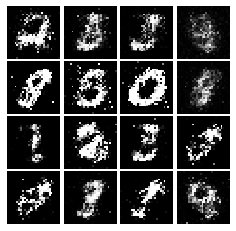

Epoch: 5, Iter: 2440, D: 1.196, G:1.853


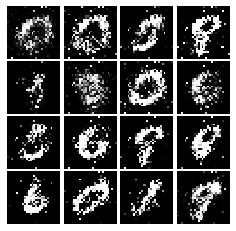

Epoch: 5, Iter: 2460, D: 1.285, G:0.8288


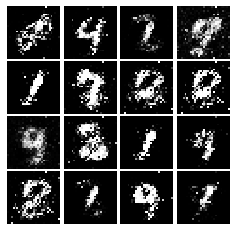

Epoch: 5, Iter: 2480, D: 1.241, G:0.9128


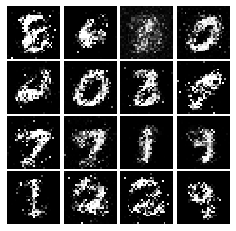

Epoch: 5, Iter: 2500, D: 1.37, G:0.8147


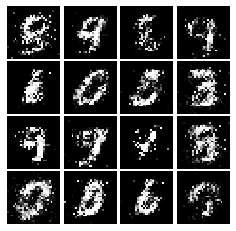

Epoch: 5, Iter: 2520, D: 1.425, G:0.7313


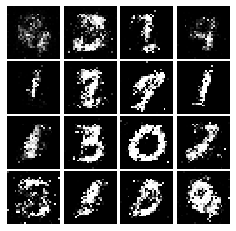

Epoch: 5, Iter: 2540, D: 1.301, G:0.7909


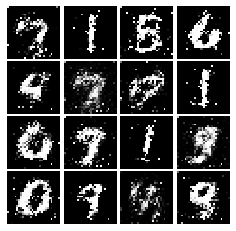

Epoch: 5, Iter: 2560, D: 1.422, G:0.6652


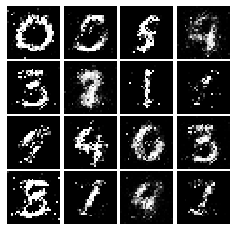

Epoch: 5, Iter: 2580, D: 1.333, G:0.8183


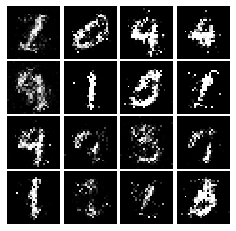

Epoch: 5, Iter: 2600, D: 1.325, G:0.9225


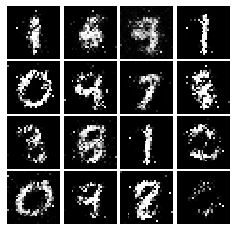

Epoch: 5, Iter: 2620, D: 1.305, G:0.9359


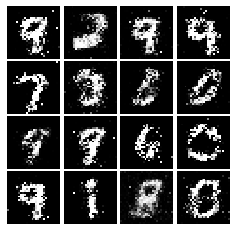

Epoch: 5, Iter: 2640, D: 1.322, G:0.8542


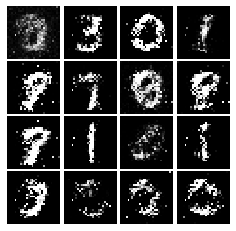

Epoch: 5, Iter: 2660, D: 1.345, G:0.8164


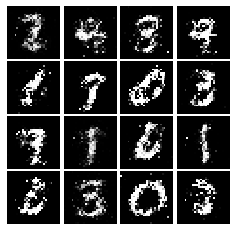

Epoch: 5, Iter: 2680, D: 1.406, G:0.7883


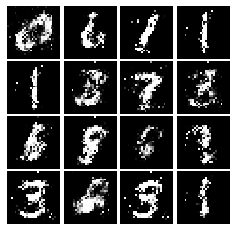

Epoch: 5, Iter: 2700, D: 1.356, G:0.7748


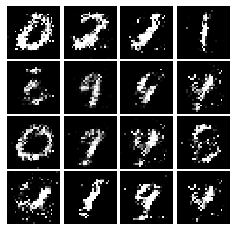

Epoch: 5, Iter: 2720, D: 1.422, G:0.8571


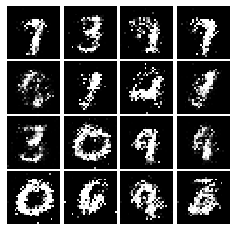

Epoch: 5, Iter: 2740, D: 1.443, G:0.8305


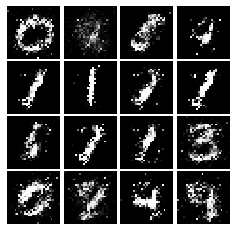

Epoch: 5, Iter: 2760, D: 1.263, G:0.8066


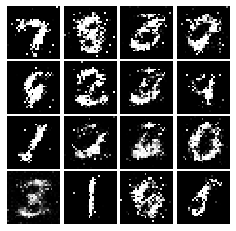

Epoch: 5, Iter: 2780, D: 1.24, G:0.735


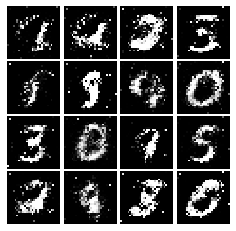

Epoch: 5, Iter: 2800, D: 1.312, G:0.8114


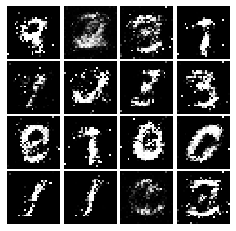

Epoch: 6, Iter: 2820, D: 1.318, G:0.8412


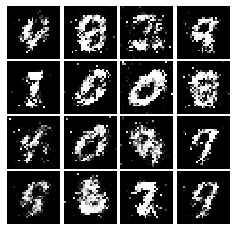

Epoch: 6, Iter: 2840, D: 1.474, G:0.9381


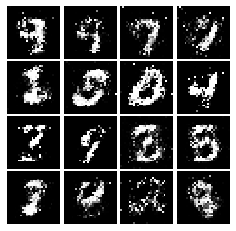

Epoch: 6, Iter: 2860, D: 1.264, G:0.8634


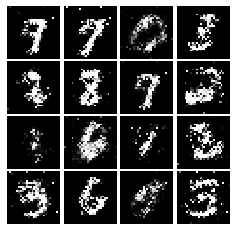

Epoch: 6, Iter: 2880, D: 1.409, G:1.039


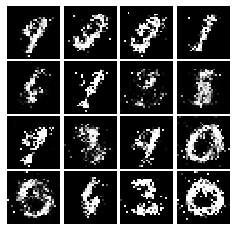

Epoch: 6, Iter: 2900, D: 1.272, G:0.9425


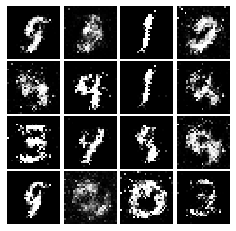

Epoch: 6, Iter: 2920, D: 1.399, G:0.8166


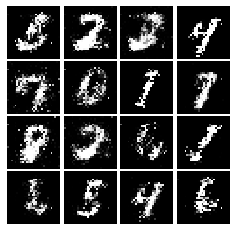

Epoch: 6, Iter: 2940, D: 1.328, G:0.8323


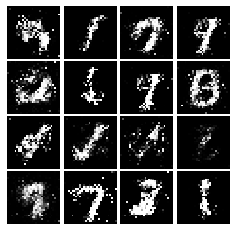

Epoch: 6, Iter: 2960, D: 1.296, G:0.7769


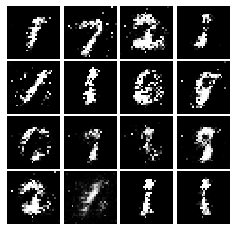

Epoch: 6, Iter: 2980, D: 1.354, G:0.7623


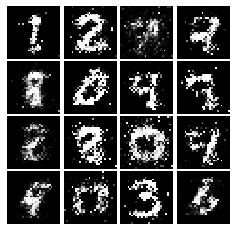

Epoch: 6, Iter: 3000, D: 1.363, G:0.8302


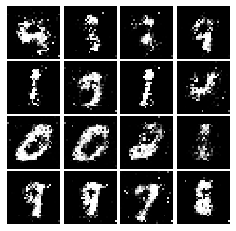

Epoch: 6, Iter: 3020, D: 1.301, G:0.9005


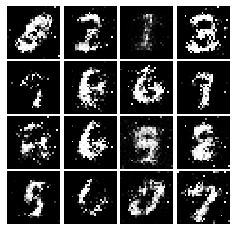

Epoch: 6, Iter: 3040, D: 1.364, G:0.787


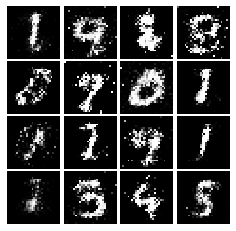

Epoch: 6, Iter: 3060, D: 1.334, G:0.8549


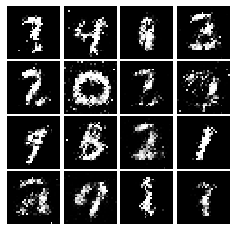

Epoch: 6, Iter: 3080, D: 1.3, G:0.8263


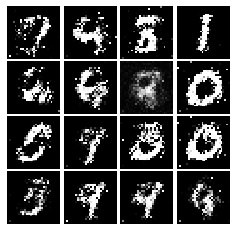

Epoch: 6, Iter: 3100, D: 1.427, G:0.8281


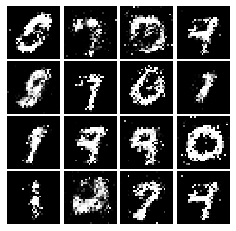

Epoch: 6, Iter: 3120, D: 1.306, G:0.762


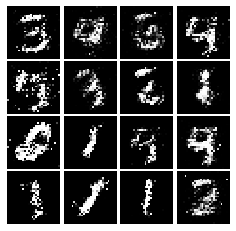

Epoch: 6, Iter: 3140, D: 1.348, G:0.7797


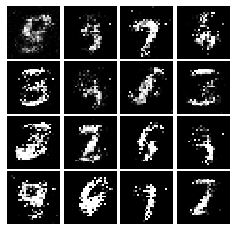

Epoch: 6, Iter: 3160, D: 1.3, G:0.9177


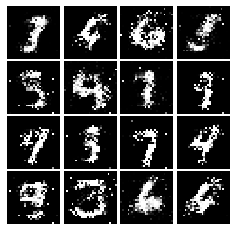

Epoch: 6, Iter: 3180, D: 1.389, G:0.7286


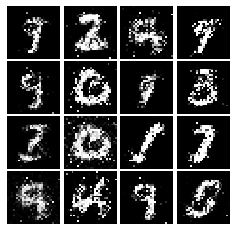

Epoch: 6, Iter: 3200, D: 1.355, G:0.9175


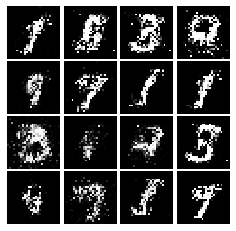

Epoch: 6, Iter: 3220, D: 1.299, G:0.7209


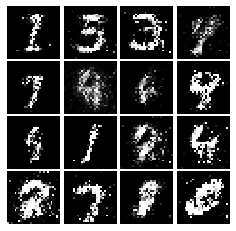

Epoch: 6, Iter: 3240, D: 1.297, G:0.7733


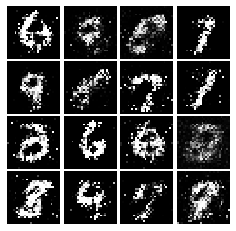

Epoch: 6, Iter: 3260, D: 1.349, G:0.8305


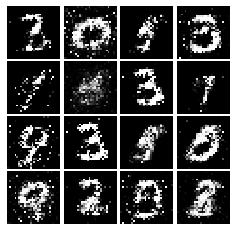

Epoch: 6, Iter: 3280, D: 1.566, G:0.6671


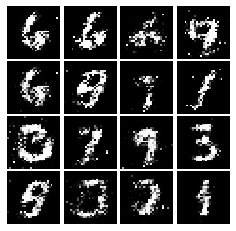

Epoch: 7, Iter: 3300, D: 1.321, G:0.7818


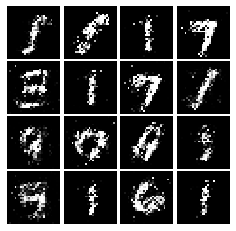

Epoch: 7, Iter: 3320, D: 1.255, G:0.855


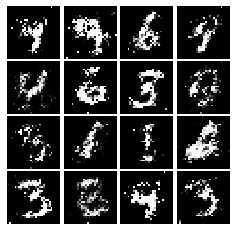

Epoch: 7, Iter: 3340, D: 1.339, G:0.9003


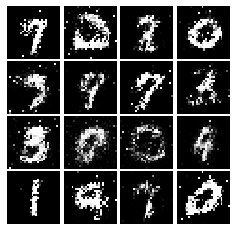

Epoch: 7, Iter: 3360, D: 1.27, G:0.8083


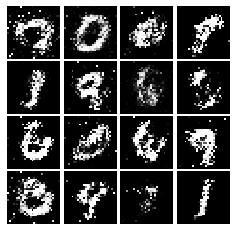

Epoch: 7, Iter: 3380, D: 1.208, G:0.8948


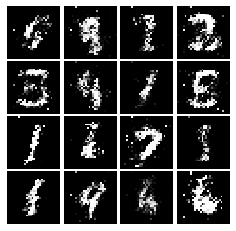

Epoch: 7, Iter: 3400, D: 1.409, G:0.8041


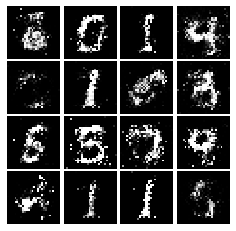

Epoch: 7, Iter: 3420, D: 1.429, G:0.8051


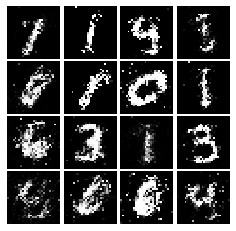

Epoch: 7, Iter: 3440, D: 1.502, G:0.8452


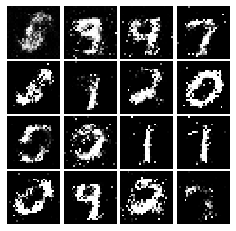

Epoch: 7, Iter: 3460, D: 1.284, G:0.8278


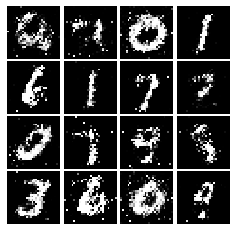

Epoch: 7, Iter: 3480, D: 1.302, G:0.7689


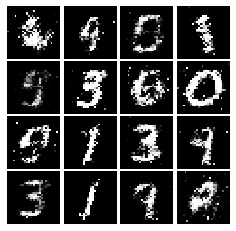

Epoch: 7, Iter: 3500, D: 1.389, G:0.7409


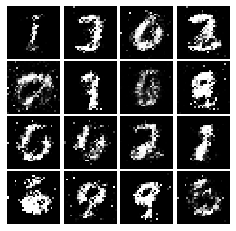

Epoch: 7, Iter: 3520, D: 1.447, G:0.7527


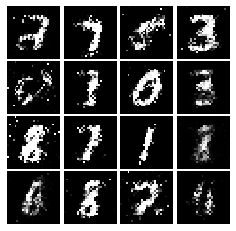

Epoch: 7, Iter: 3540, D: 1.318, G:0.7017


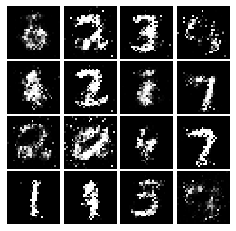

Epoch: 7, Iter: 3560, D: 1.336, G:0.7763


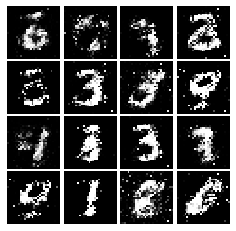

Epoch: 7, Iter: 3580, D: 1.346, G:0.8068


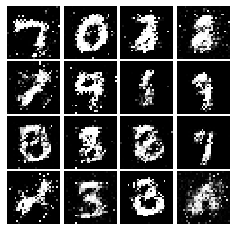

Epoch: 7, Iter: 3600, D: 1.341, G:0.7342


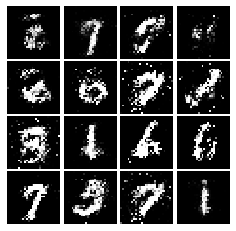

Epoch: 7, Iter: 3620, D: 1.373, G:0.7798


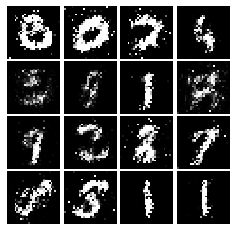

Epoch: 7, Iter: 3640, D: 1.453, G:0.7428


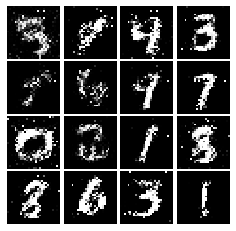

Epoch: 7, Iter: 3660, D: 1.384, G:0.7467


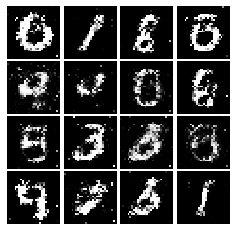

Epoch: 7, Iter: 3680, D: 1.312, G:0.775


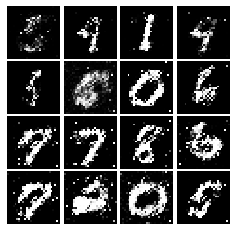

Epoch: 7, Iter: 3700, D: 1.435, G:0.7642


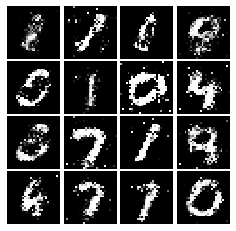

Epoch: 7, Iter: 3720, D: 1.373, G:0.7821


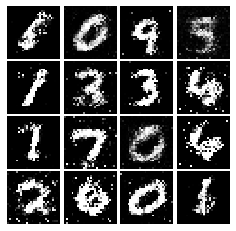

Epoch: 7, Iter: 3740, D: 1.375, G:0.7029


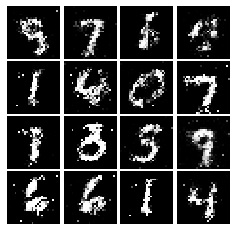

Epoch: 8, Iter: 3760, D: 1.36, G:0.9022


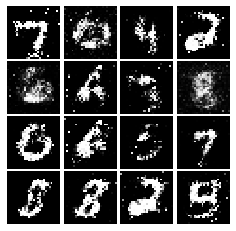

Epoch: 8, Iter: 3780, D: 1.367, G:0.7878


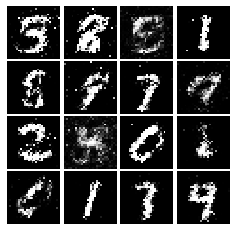

Epoch: 8, Iter: 3800, D: 1.322, G:0.7678


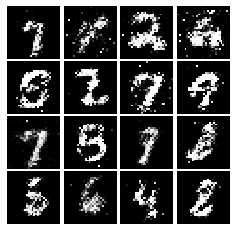

Epoch: 8, Iter: 3820, D: 1.372, G:0.8289


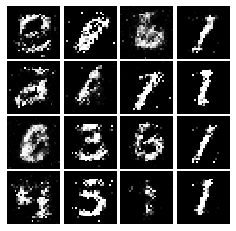

Epoch: 8, Iter: 3840, D: 1.402, G:0.7511


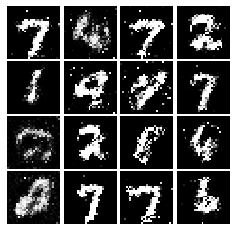

Epoch: 8, Iter: 3860, D: 1.351, G:0.7463


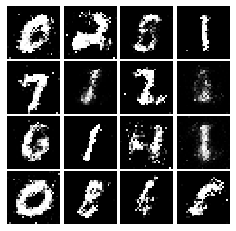

Epoch: 8, Iter: 3880, D: 1.397, G:0.7826


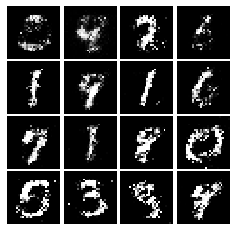

Epoch: 8, Iter: 3900, D: 1.378, G:0.7382


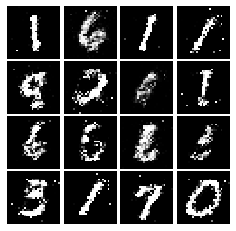

Epoch: 8, Iter: 3920, D: 1.316, G:0.7986


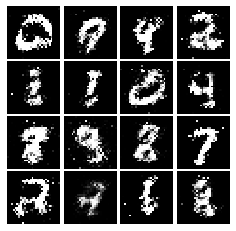

Epoch: 8, Iter: 3940, D: 1.323, G:0.7688


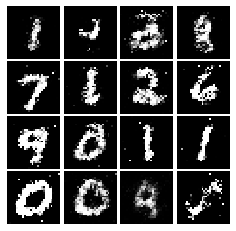

Epoch: 8, Iter: 3960, D: 1.33, G:0.7437


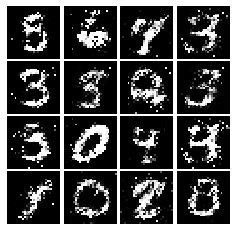

Epoch: 8, Iter: 3980, D: 1.361, G:0.8191


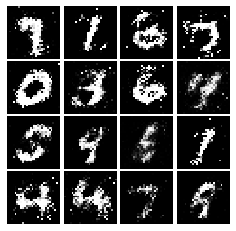

Epoch: 8, Iter: 4000, D: 1.326, G:0.8059


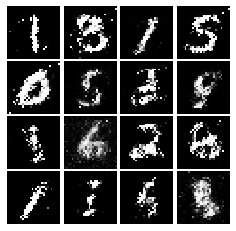

Epoch: 8, Iter: 4020, D: 1.366, G:0.7171


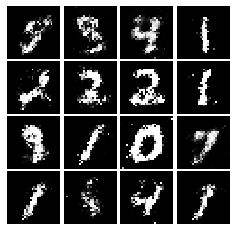

Epoch: 8, Iter: 4040, D: 1.385, G:0.778


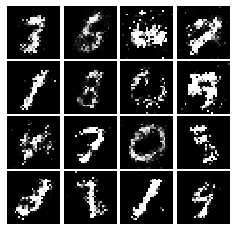

Epoch: 8, Iter: 4060, D: 1.414, G:0.6924


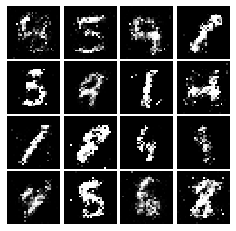

Epoch: 8, Iter: 4080, D: 1.416, G:0.7376


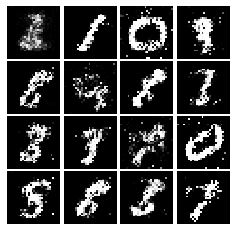

Epoch: 8, Iter: 4100, D: 1.343, G:0.8283


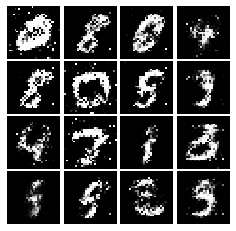

Epoch: 8, Iter: 4120, D: 1.352, G:0.7266


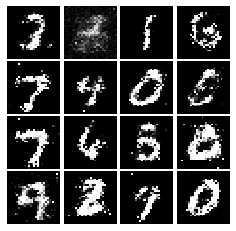

Epoch: 8, Iter: 4140, D: 1.365, G:0.8469


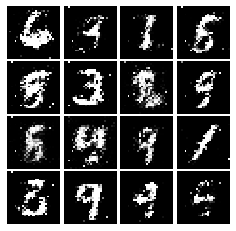

Epoch: 8, Iter: 4160, D: 1.357, G:0.7817


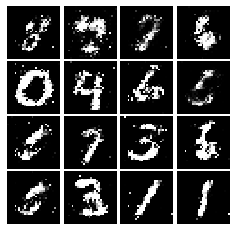

Epoch: 8, Iter: 4180, D: 1.331, G:0.7484


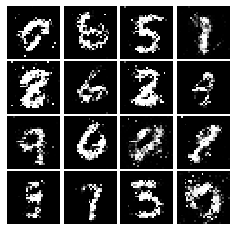

Epoch: 8, Iter: 4200, D: 1.387, G:0.7898


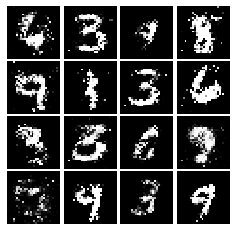

Epoch: 8, Iter: 4220, D: 1.321, G:0.8733


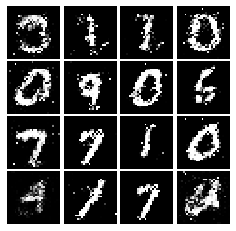

Epoch: 9, Iter: 4240, D: 1.355, G:0.8207


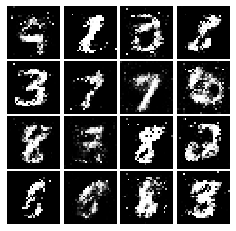

Epoch: 9, Iter: 4260, D: 1.384, G:0.8028


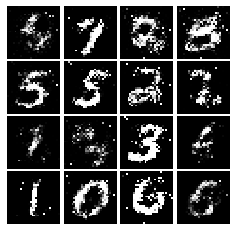

Epoch: 9, Iter: 4280, D: 1.414, G:0.7256


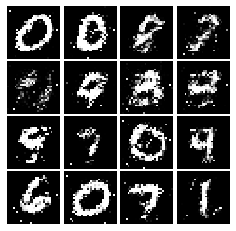

Epoch: 9, Iter: 4300, D: 1.408, G:0.5838


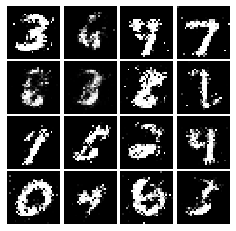

Epoch: 9, Iter: 4320, D: 1.34, G:0.8203


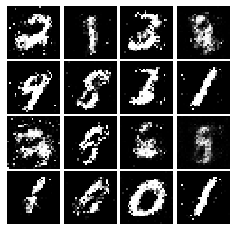

Epoch: 9, Iter: 4340, D: 1.411, G:0.8402


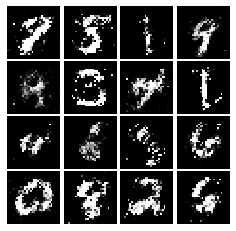

Epoch: 9, Iter: 4360, D: 1.309, G:0.766


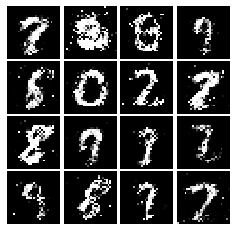

Epoch: 9, Iter: 4380, D: 1.391, G:0.916


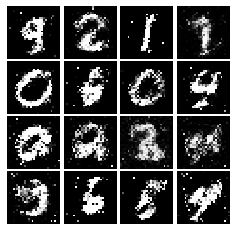

Epoch: 9, Iter: 4400, D: 1.323, G:0.873


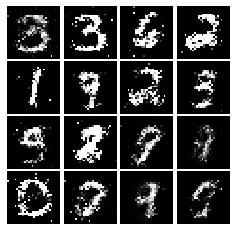

Epoch: 9, Iter: 4420, D: 1.375, G:0.73


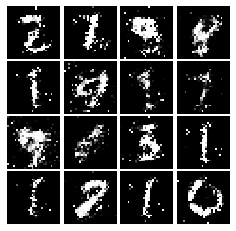

Epoch: 9, Iter: 4440, D: 1.363, G:0.6501


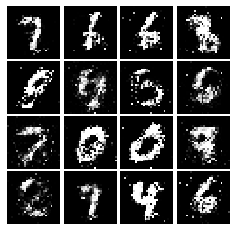

Epoch: 9, Iter: 4460, D: 1.374, G:0.8692


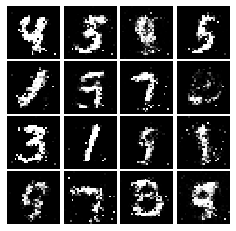

Epoch: 9, Iter: 4480, D: 1.338, G:0.8107


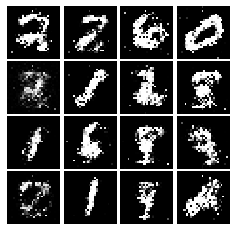

Epoch: 9, Iter: 4500, D: 1.472, G:0.7398


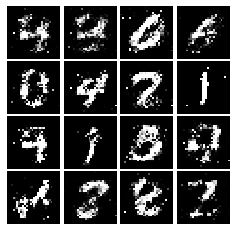

Epoch: 9, Iter: 4520, D: 1.351, G:0.7435


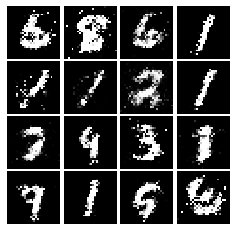

Epoch: 9, Iter: 4540, D: 1.35, G:0.8326


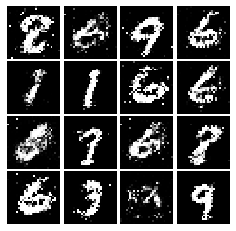

Epoch: 9, Iter: 4560, D: 1.334, G:0.7159


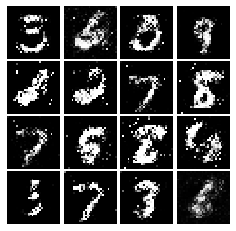

Epoch: 9, Iter: 4580, D: 1.348, G:0.8047


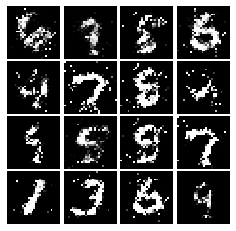

Epoch: 9, Iter: 4600, D: 1.384, G:0.8101


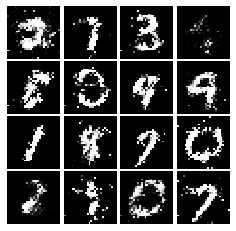

Epoch: 9, Iter: 4620, D: 1.402, G:0.8411


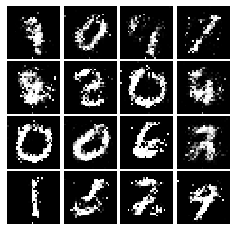

Epoch: 9, Iter: 4640, D: 1.369, G:0.6986


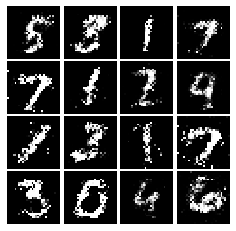

Epoch: 9, Iter: 4660, D: 1.366, G:0.7564


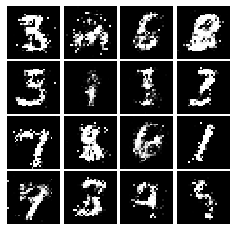

Epoch: 9, Iter: 4680, D: 1.349, G:0.7321


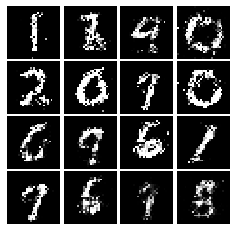

Final images


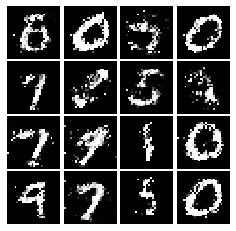

In [71]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [84]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    loss = 0.5 * tf.math.reduce_mean((scores_real - 1) ** 2) + 0.5 * tf.math.reduce_mean((scores_fake ** 2))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.math.reduce_mean((scores_fake - 1) ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [85]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.0686, G:0.6401


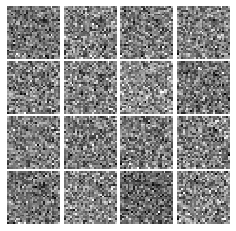

Epoch: 0, Iter: 20, D: 0.03897, G:0.7958


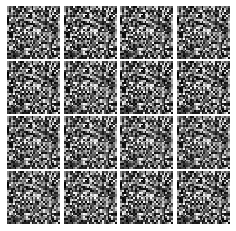

Epoch: 0, Iter: 40, D: 0.005907, G:0.568


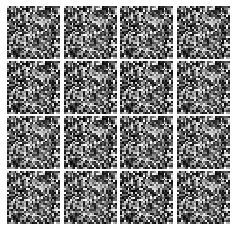

Epoch: 0, Iter: 60, D: 0.03131, G:1.116


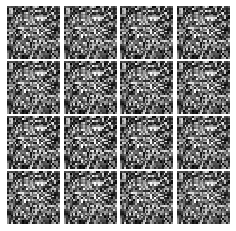

Epoch: 0, Iter: 80, D: 0.1954, G:0.455


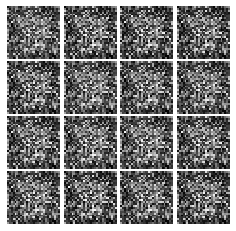

Epoch: 0, Iter: 100, D: 0.06274, G:0.4397


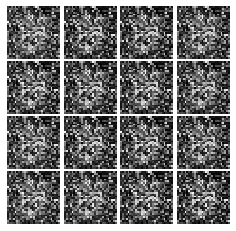

Epoch: 0, Iter: 120, D: 0.1126, G:1.466


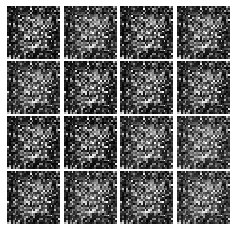

Epoch: 0, Iter: 140, D: 0.07131, G:0.5083


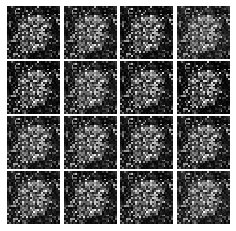

Epoch: 0, Iter: 160, D: 0.1032, G:0.593


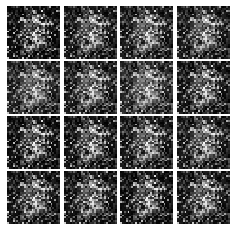

Epoch: 0, Iter: 180, D: 0.4241, G:1.179


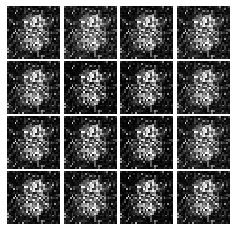

Epoch: 0, Iter: 200, D: 0.1398, G:0.5954


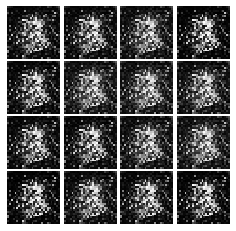

Epoch: 0, Iter: 220, D: 0.3961, G:1.223


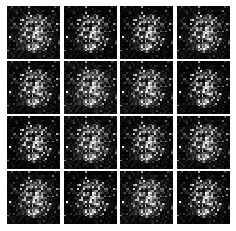

Epoch: 0, Iter: 240, D: 0.1383, G:0.4974


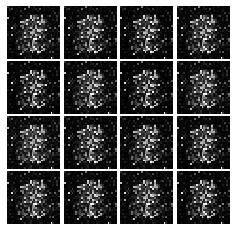

Epoch: 0, Iter: 260, D: 1.099, G:0.02242


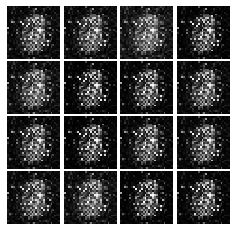

Epoch: 0, Iter: 280, D: 0.1891, G:0.2829


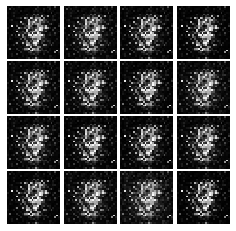

Epoch: 0, Iter: 300, D: 0.2384, G:0.9721


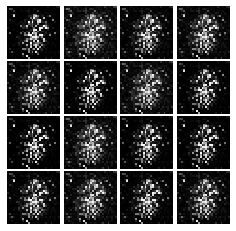

Epoch: 0, Iter: 320, D: 0.05199, G:0.4146


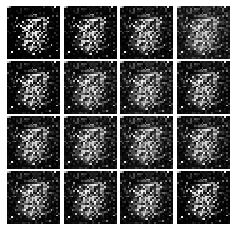

Epoch: 0, Iter: 340, D: 0.0271, G:0.7623


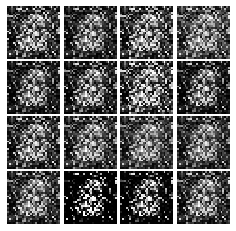

Epoch: 0, Iter: 360, D: 0.2111, G:0.5949


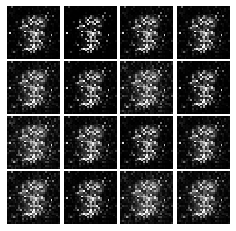

Epoch: 0, Iter: 380, D: 1.731, G:1.771


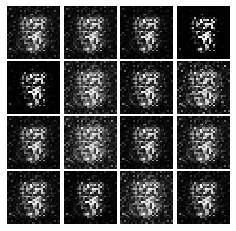

Epoch: 0, Iter: 400, D: 0.1332, G:0.4441


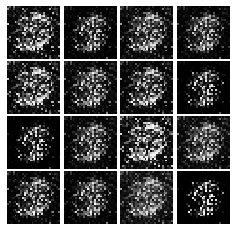

Epoch: 0, Iter: 420, D: 0.2333, G:0.7219


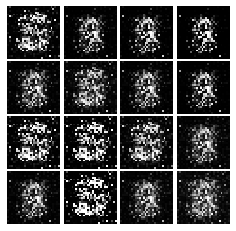

Epoch: 0, Iter: 440, D: 0.1554, G:0.3584


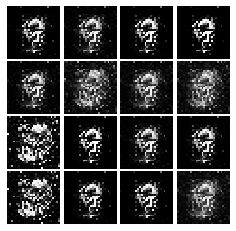

Epoch: 0, Iter: 460, D: 0.05608, G:0.4285


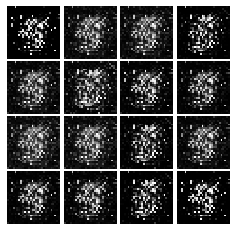

Epoch: 1, Iter: 480, D: 0.1138, G:0.254


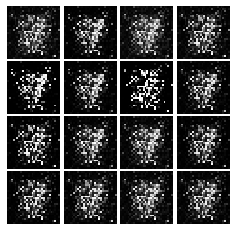

Epoch: 1, Iter: 500, D: 0.155, G:0.5201


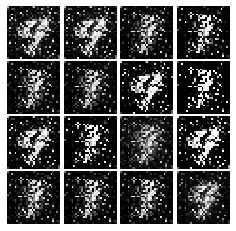

Epoch: 1, Iter: 520, D: 0.1725, G:0.3139


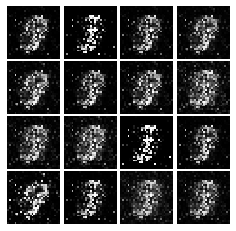

Epoch: 1, Iter: 540, D: 0.175, G:0.2511


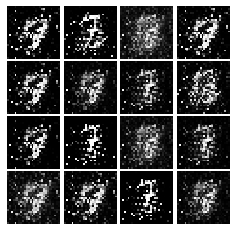

Epoch: 1, Iter: 560, D: 0.2278, G:0.2336


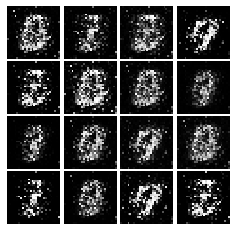

Epoch: 1, Iter: 580, D: 0.1688, G:0.3096


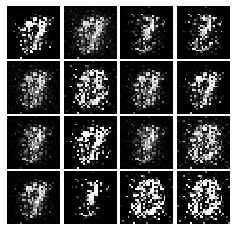

Epoch: 1, Iter: 600, D: 0.1405, G:0.4721


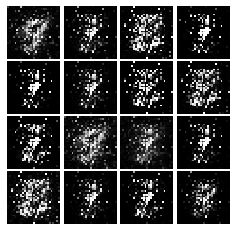

Epoch: 1, Iter: 620, D: 0.183, G:0.3448


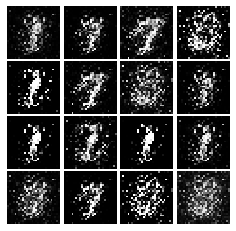

Epoch: 1, Iter: 640, D: 0.149, G:0.3392


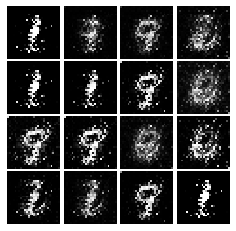

Epoch: 1, Iter: 660, D: 0.2051, G:0.2332


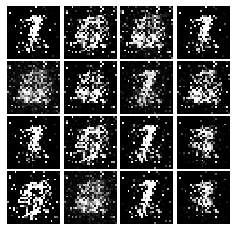

Epoch: 1, Iter: 680, D: 0.1729, G:0.2277


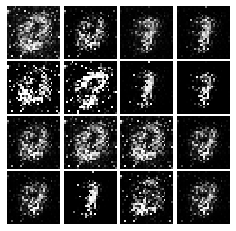

Epoch: 1, Iter: 700, D: 0.1465, G:0.2078


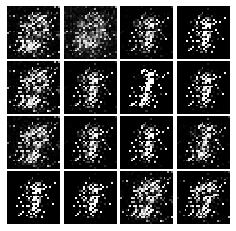

Epoch: 1, Iter: 720, D: 0.1059, G:0.2346


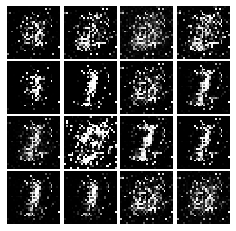

Epoch: 1, Iter: 740, D: 0.1512, G:0.222


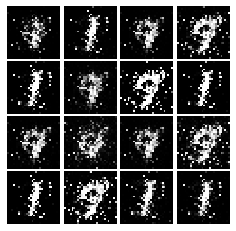

Epoch: 1, Iter: 760, D: 0.131, G:0.288


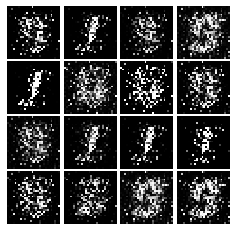

Epoch: 1, Iter: 780, D: 0.1255, G:0.1529


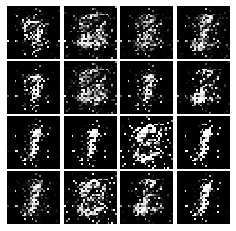

Epoch: 1, Iter: 800, D: 0.1007, G:0.3755


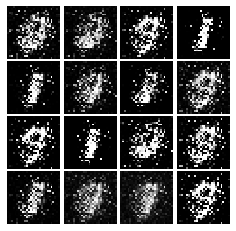

Epoch: 1, Iter: 820, D: 0.1922, G:0.3057


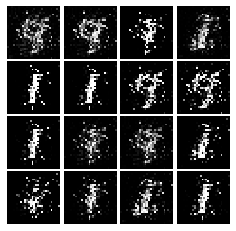

Epoch: 1, Iter: 840, D: 0.1438, G:0.3531


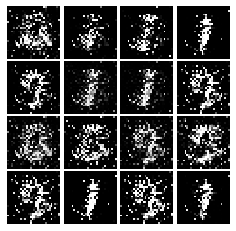

Epoch: 1, Iter: 860, D: 0.1518, G:0.2996


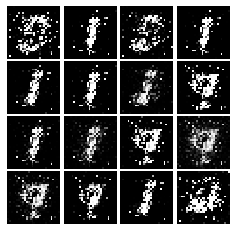

Epoch: 1, Iter: 880, D: 0.1082, G:0.3582


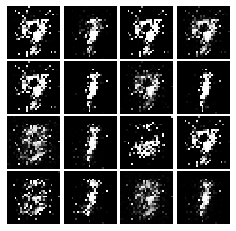

Epoch: 1, Iter: 900, D: 0.1236, G:0.4008


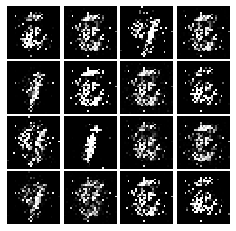

Epoch: 1, Iter: 920, D: 0.1491, G:0.2354


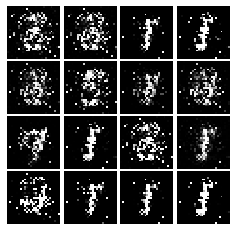

Epoch: 2, Iter: 940, D: 0.1924, G:0.615


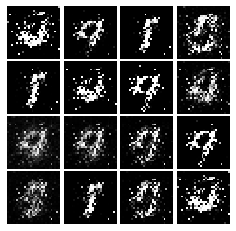

Epoch: 2, Iter: 960, D: 0.1418, G:0.3393


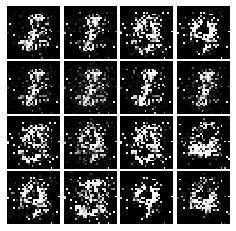

Epoch: 2, Iter: 980, D: 0.0972, G:0.4707


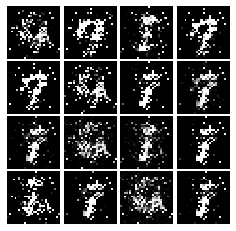

Epoch: 2, Iter: 1000, D: 0.1136, G:0.3153


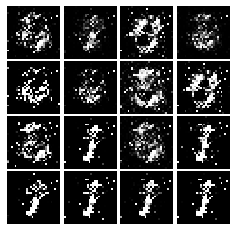

Epoch: 2, Iter: 1020, D: 0.09225, G:0.4232


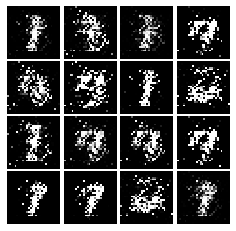

Epoch: 2, Iter: 1040, D: 0.1116, G:0.4415


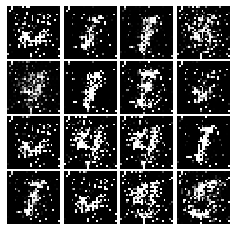

Epoch: 2, Iter: 1060, D: 0.1341, G:0.2492


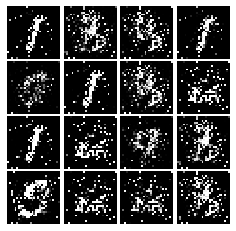

Epoch: 2, Iter: 1080, D: 0.1197, G:0.4876


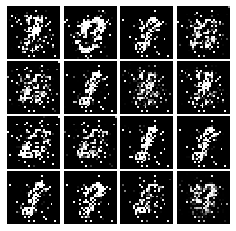

Epoch: 2, Iter: 1100, D: 0.1856, G:0.1976


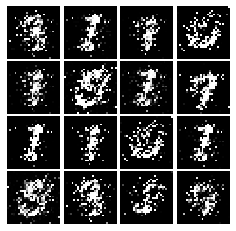

Epoch: 2, Iter: 1120, D: 0.1101, G:0.4169


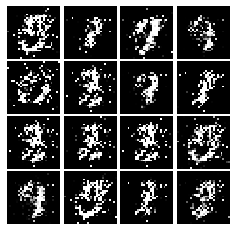

Epoch: 2, Iter: 1140, D: 0.08493, G:0.5662


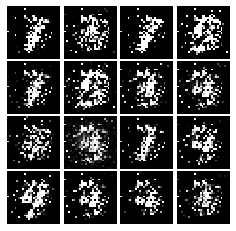

Epoch: 2, Iter: 1160, D: 0.5506, G:0.01655


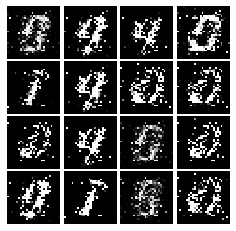

Epoch: 2, Iter: 1180, D: 0.1723, G:0.2361


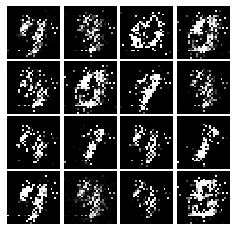

Epoch: 2, Iter: 1200, D: 0.1409, G:0.2755


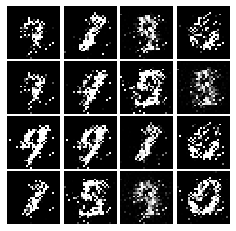

Epoch: 2, Iter: 1220, D: 0.1026, G:0.5067


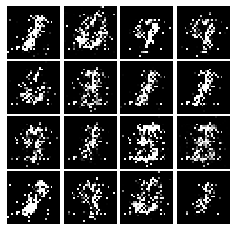

Epoch: 2, Iter: 1240, D: 0.1039, G:0.2303


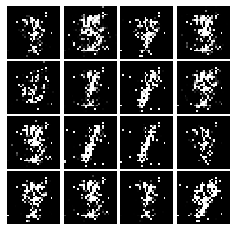

Epoch: 2, Iter: 1260, D: 0.05439, G:0.3733


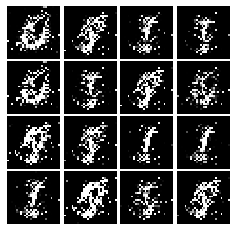

Epoch: 2, Iter: 1280, D: 0.1473, G:0.6588


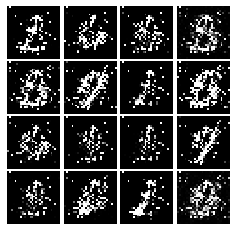

Epoch: 2, Iter: 1300, D: 0.1735, G:0.3658


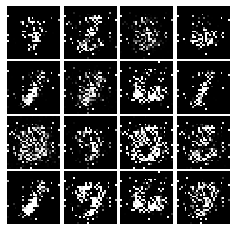

Epoch: 2, Iter: 1320, D: 0.1853, G:0.2596


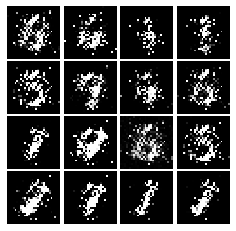

Epoch: 2, Iter: 1340, D: 0.1333, G:0.4424


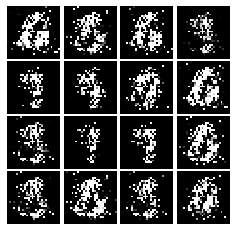

Epoch: 2, Iter: 1360, D: 0.1558, G:0.2569


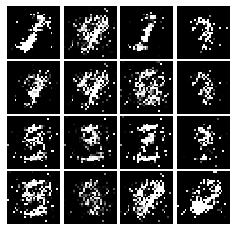

Epoch: 2, Iter: 1380, D: 0.1846, G:0.6241


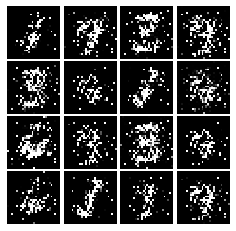

Epoch: 2, Iter: 1400, D: 0.0718, G:0.7223


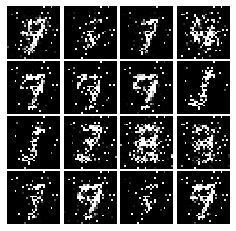

Epoch: 3, Iter: 1420, D: 0.1413, G:0.2575


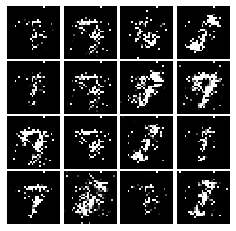

Epoch: 3, Iter: 1440, D: 0.162, G:0.3071


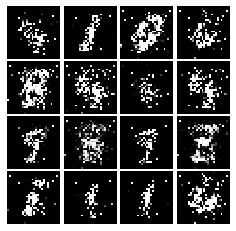

Epoch: 3, Iter: 1460, D: 0.1244, G:0.282


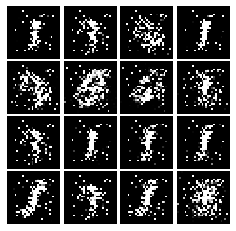

Epoch: 3, Iter: 1480, D: 0.2098, G:0.142


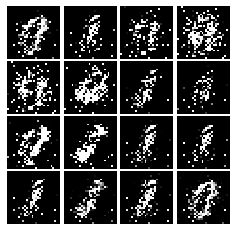

Epoch: 3, Iter: 1500, D: 0.1581, G:0.2802


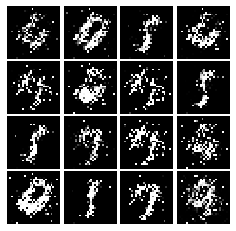

Epoch: 3, Iter: 1520, D: 0.1682, G:0.26


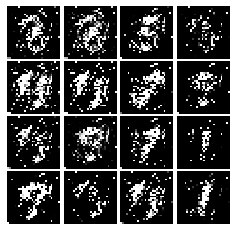

Epoch: 3, Iter: 1540, D: 0.4914, G:0.1474


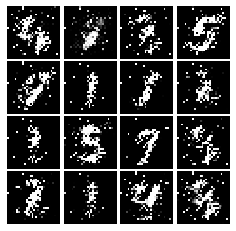

Epoch: 3, Iter: 1560, D: 0.1041, G:0.7811


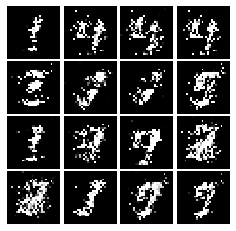

Epoch: 3, Iter: 1580, D: 0.1408, G:0.2853


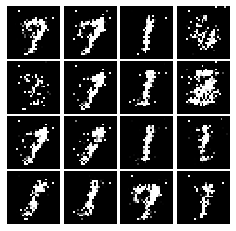

Epoch: 3, Iter: 1600, D: 0.1223, G:0.3048


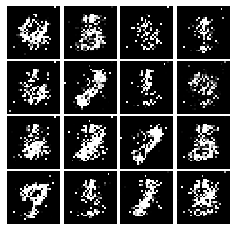

Epoch: 3, Iter: 1620, D: 0.1215, G:0.3002


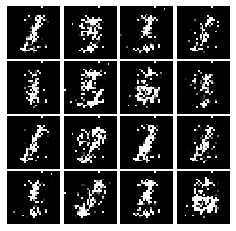

Epoch: 3, Iter: 1640, D: 0.1679, G:0.2888


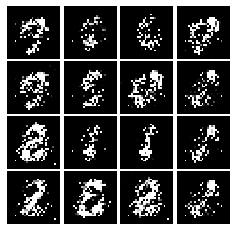

Epoch: 3, Iter: 1660, D: 0.1294, G:0.5196


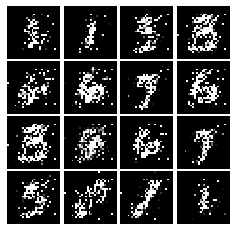

Epoch: 3, Iter: 1680, D: 0.1143, G:0.5087


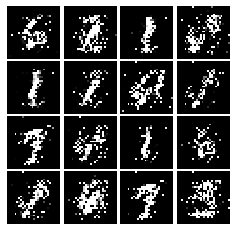

Epoch: 3, Iter: 1700, D: 0.1287, G:0.3403


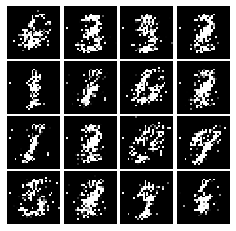

Epoch: 3, Iter: 1720, D: 0.2066, G:0.2221


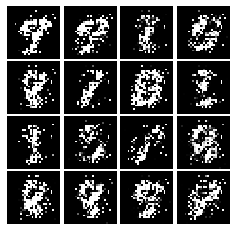

Epoch: 3, Iter: 1740, D: 0.1389, G:0.2925


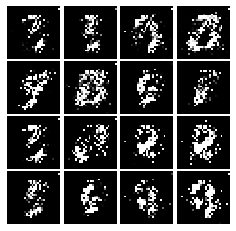

Epoch: 3, Iter: 1760, D: 0.1199, G:0.3204


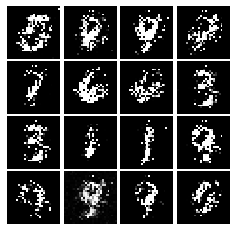

Epoch: 3, Iter: 1780, D: 0.1234, G:0.3037


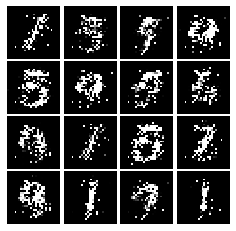

Epoch: 3, Iter: 1800, D: 0.1497, G:0.3356


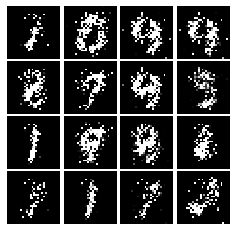

Epoch: 3, Iter: 1820, D: 0.1824, G:0.1675


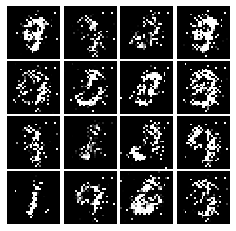

Epoch: 3, Iter: 1840, D: 0.1306, G:0.2728


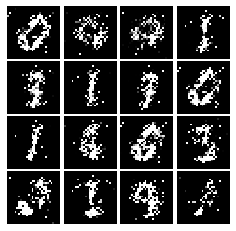

Epoch: 3, Iter: 1860, D: 0.1557, G:0.3018


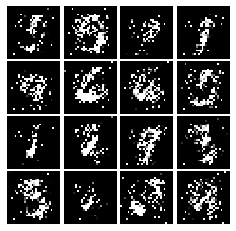

Epoch: 4, Iter: 1880, D: 0.1287, G:0.3622


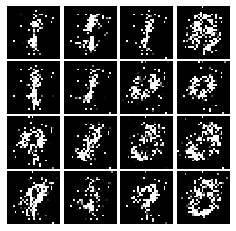

Epoch: 4, Iter: 1900, D: 0.1374, G:0.2406


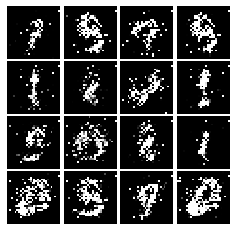

Epoch: 4, Iter: 1920, D: 0.1481, G:0.3629


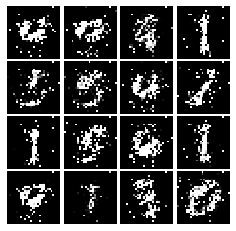

Epoch: 4, Iter: 1940, D: 0.1779, G:0.2376


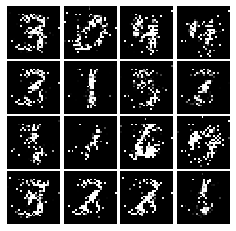

Epoch: 4, Iter: 1960, D: 0.1528, G:0.2762


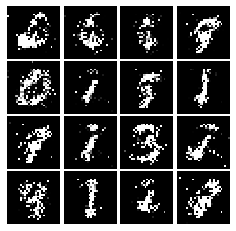

Epoch: 4, Iter: 1980, D: 0.1793, G:0.1925


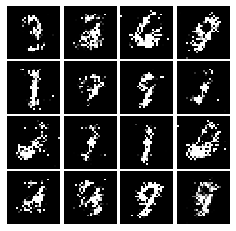

Epoch: 4, Iter: 2000, D: 0.1646, G:0.2389


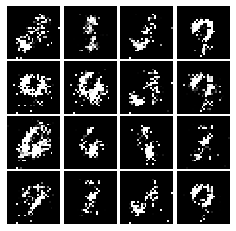

Epoch: 4, Iter: 2020, D: 0.1964, G:0.237


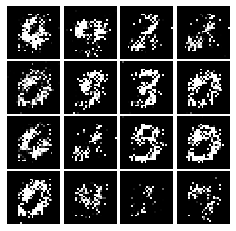

Epoch: 4, Iter: 2040, D: 0.1778, G:0.2363


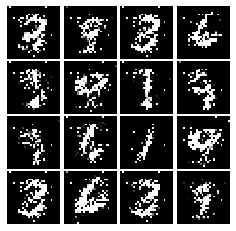

Epoch: 4, Iter: 2060, D: 0.1825, G:0.1968


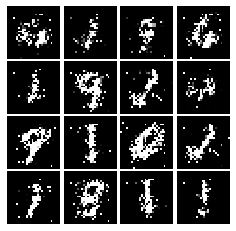

Epoch: 4, Iter: 2080, D: 0.1864, G:0.2153


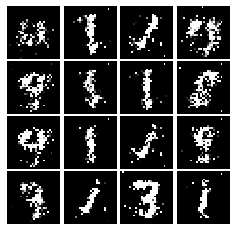

Epoch: 4, Iter: 2100, D: 0.1906, G:0.2397


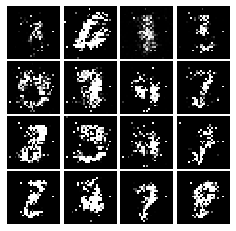

Epoch: 4, Iter: 2120, D: 0.1341, G:0.3021


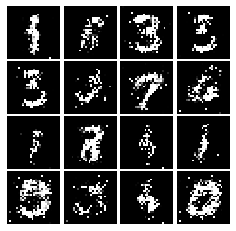

Epoch: 4, Iter: 2140, D: 0.1719, G:0.2356


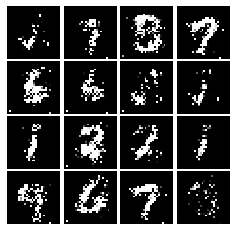

Epoch: 4, Iter: 2160, D: 0.1719, G:0.2112


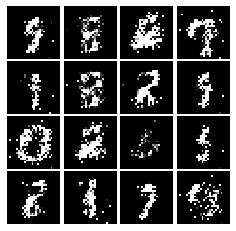

Epoch: 4, Iter: 2180, D: 0.1479, G:0.2542


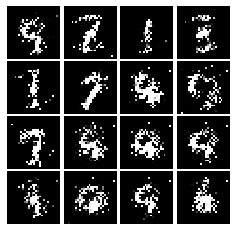

Epoch: 4, Iter: 2200, D: 0.1781, G:0.2691


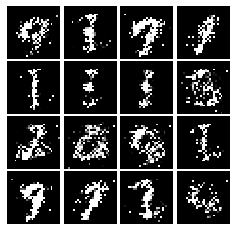

Epoch: 4, Iter: 2220, D: 0.1224, G:0.342


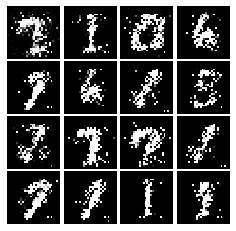

Epoch: 4, Iter: 2240, D: 0.1877, G:0.1485


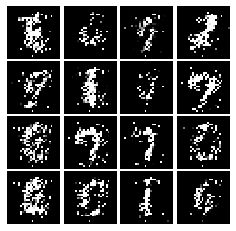

Epoch: 4, Iter: 2260, D: 0.168, G:0.2934


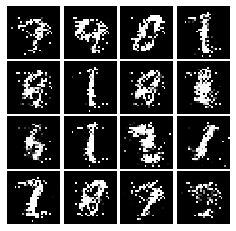

Epoch: 4, Iter: 2280, D: 0.174, G:0.2375


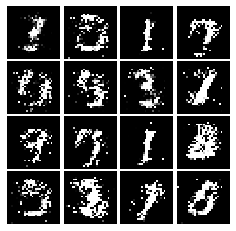

Epoch: 4, Iter: 2300, D: 0.1798, G:0.2093


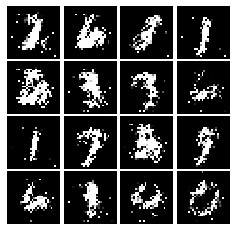

Epoch: 4, Iter: 2320, D: 0.1773, G:0.244


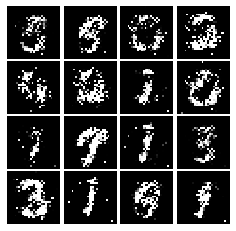

Epoch: 4, Iter: 2340, D: 0.139, G:0.4993


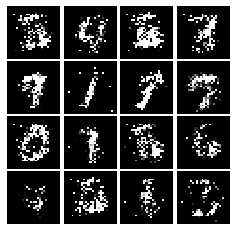

Epoch: 5, Iter: 2360, D: 0.1797, G:0.2312


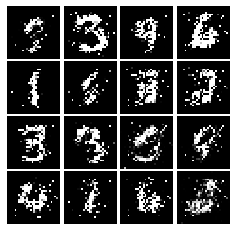

Epoch: 5, Iter: 2380, D: 0.1981, G:0.2124


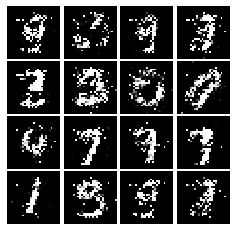

Epoch: 5, Iter: 2400, D: 0.194, G:0.2088


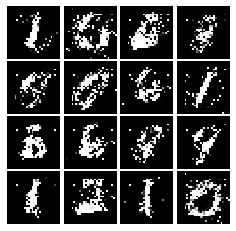

Epoch: 5, Iter: 2420, D: 0.1959, G:0.1817


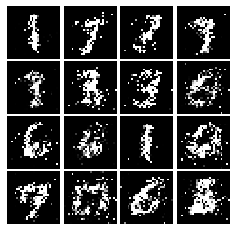

Epoch: 5, Iter: 2440, D: 0.1969, G:0.2291


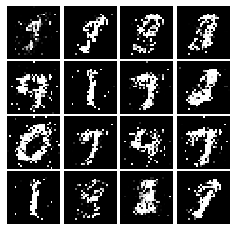

Epoch: 5, Iter: 2460, D: 0.2353, G:0.1792


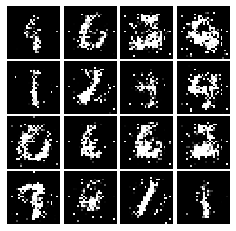

Epoch: 5, Iter: 2480, D: 0.2104, G:0.2149


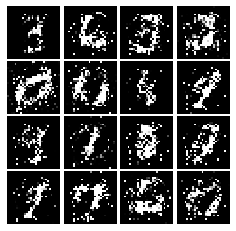

Epoch: 5, Iter: 2500, D: 0.197, G:0.1815


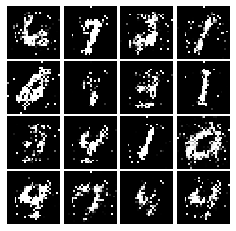

Epoch: 5, Iter: 2520, D: 0.2386, G:0.182


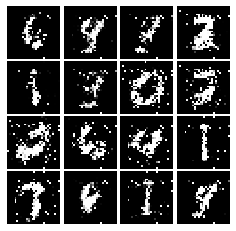

Epoch: 5, Iter: 2540, D: 0.2011, G:0.2083


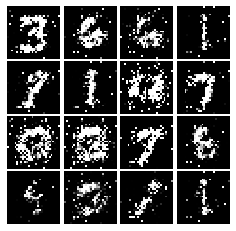

Epoch: 5, Iter: 2560, D: 0.1914, G:0.2119


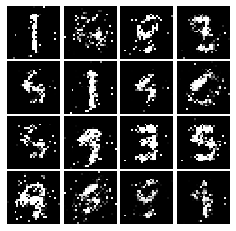

Epoch: 5, Iter: 2580, D: 0.2145, G:0.2266


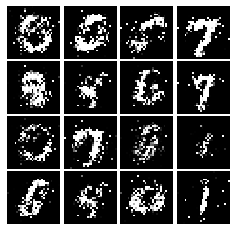

Epoch: 5, Iter: 2600, D: 0.2265, G:0.1552


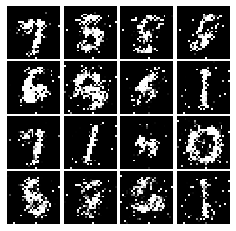

Epoch: 5, Iter: 2620, D: 0.1966, G:0.2037


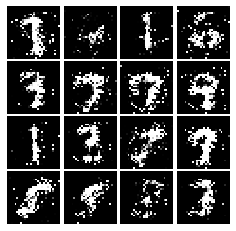

Epoch: 5, Iter: 2640, D: 0.1987, G:0.2827


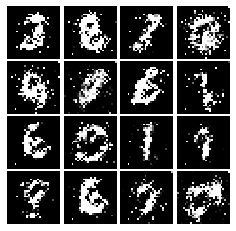

Epoch: 5, Iter: 2660, D: 0.1806, G:0.2064


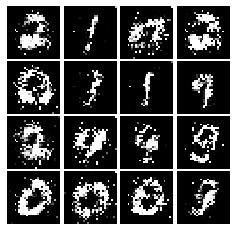

Epoch: 5, Iter: 2680, D: 0.2211, G:0.1776


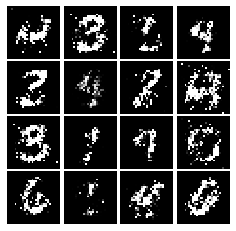

Epoch: 5, Iter: 2700, D: 0.2179, G:0.1722


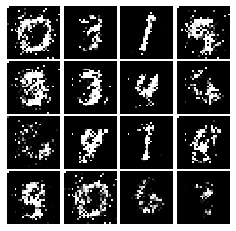

Epoch: 5, Iter: 2720, D: 0.2353, G:0.3367


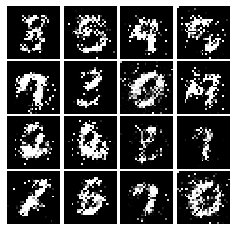

Epoch: 5, Iter: 2740, D: 0.2169, G:0.2108


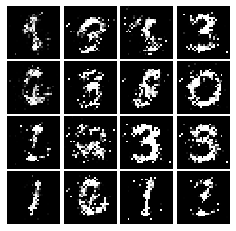

Epoch: 5, Iter: 2760, D: 0.1984, G:0.1871


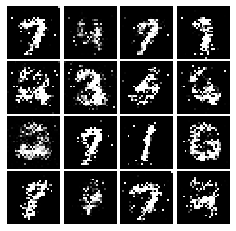

Epoch: 5, Iter: 2780, D: 0.1978, G:0.2059


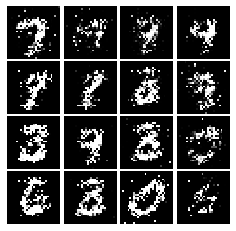

Epoch: 5, Iter: 2800, D: 0.1903, G:0.1921


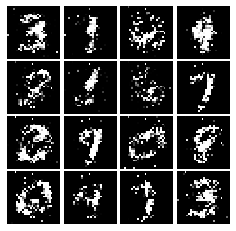

Epoch: 6, Iter: 2820, D: 0.217, G:0.1938


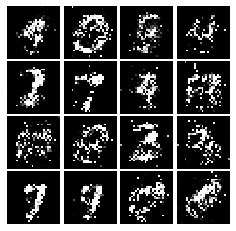

Epoch: 6, Iter: 2840, D: 0.2444, G:0.2024


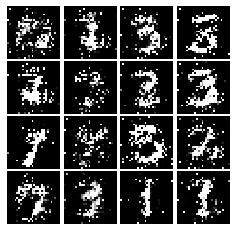

Epoch: 6, Iter: 2860, D: 0.2093, G:0.1892


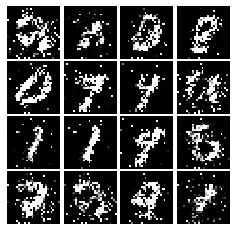

Epoch: 6, Iter: 2880, D: 0.2164, G:0.1889


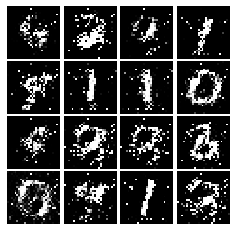

Epoch: 6, Iter: 2900, D: 0.2479, G:0.173


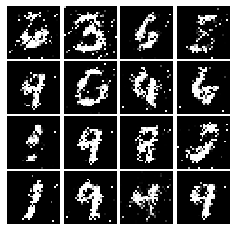

Epoch: 6, Iter: 2920, D: 0.2792, G:0.1628


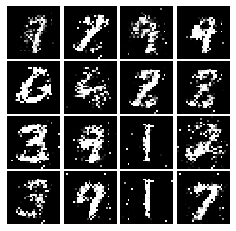

Epoch: 6, Iter: 2940, D: 0.2203, G:0.1943


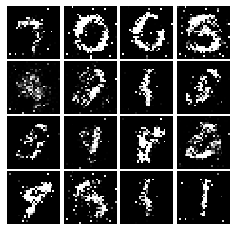

Epoch: 6, Iter: 2960, D: 0.2406, G:0.1385


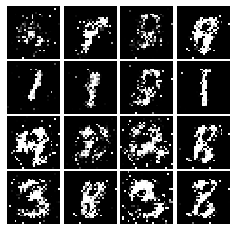

Epoch: 6, Iter: 2980, D: 0.2297, G:0.1853


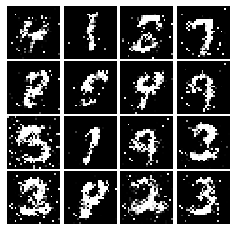

Epoch: 6, Iter: 3000, D: 0.2367, G:0.1736


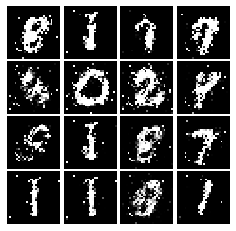

Epoch: 6, Iter: 3020, D: 0.2261, G:0.2072


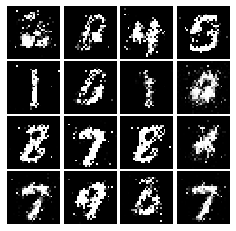

Epoch: 6, Iter: 3040, D: 0.2441, G:0.2179


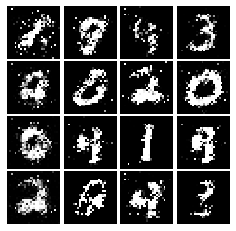

Epoch: 6, Iter: 3060, D: 0.2918, G:0.1444


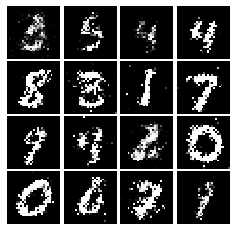

Epoch: 6, Iter: 3080, D: 0.2696, G:0.1231


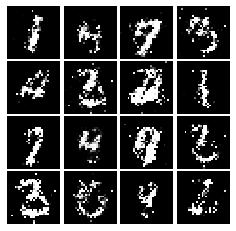

Epoch: 6, Iter: 3100, D: 0.2438, G:0.1731


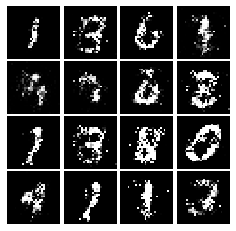

Epoch: 6, Iter: 3120, D: 0.2601, G:0.154


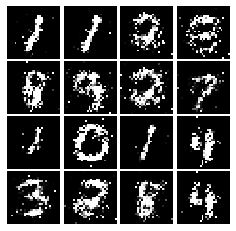

Epoch: 6, Iter: 3140, D: 0.2175, G:0.1817


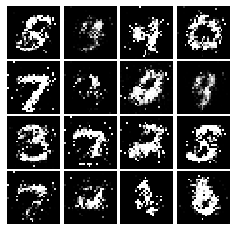

Epoch: 6, Iter: 3160, D: 0.2162, G:0.1311


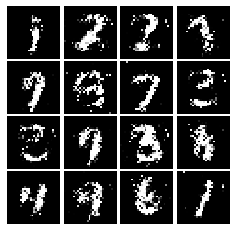

Epoch: 6, Iter: 3180, D: 0.2372, G:0.1536


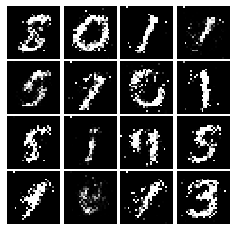

Epoch: 6, Iter: 3200, D: 0.2236, G:0.1845


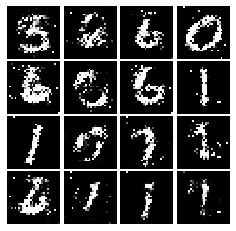

Epoch: 6, Iter: 3220, D: 0.2313, G:0.1698


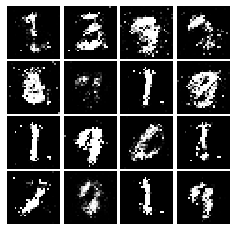

Epoch: 6, Iter: 3240, D: 0.2356, G:0.1512


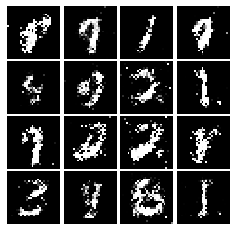

Epoch: 6, Iter: 3260, D: 0.249, G:0.1556


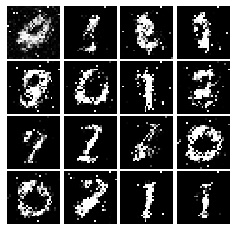

Epoch: 6, Iter: 3280, D: 0.2161, G:0.151


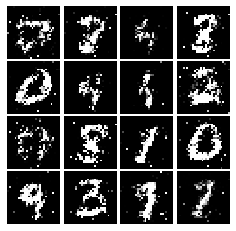

Epoch: 7, Iter: 3300, D: 0.2013, G:0.171


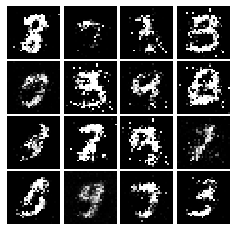

Epoch: 7, Iter: 3320, D: 0.2203, G:0.1885


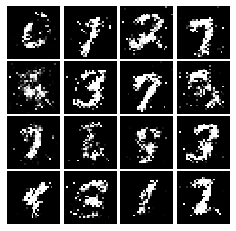

Epoch: 7, Iter: 3340, D: 0.2311, G:0.1717


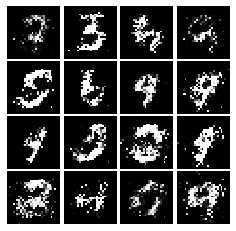

Epoch: 7, Iter: 3360, D: 0.2462, G:0.1406


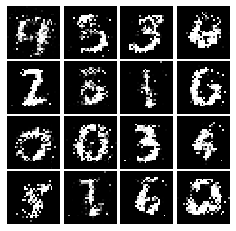

Epoch: 7, Iter: 3380, D: 0.2158, G:0.1541


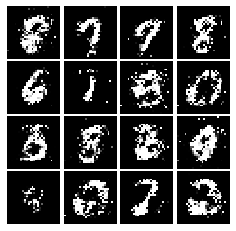

Epoch: 7, Iter: 3400, D: 0.2343, G:0.1569


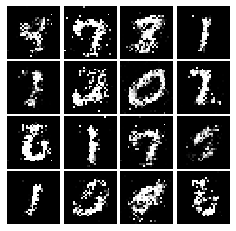

Epoch: 7, Iter: 3420, D: 0.2239, G:0.1704


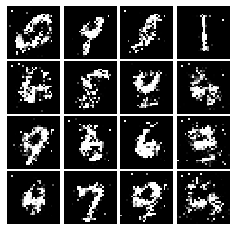

Epoch: 7, Iter: 3440, D: 0.2377, G:0.1934


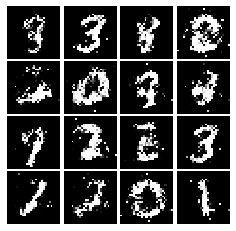

Epoch: 7, Iter: 3460, D: 0.2231, G:0.1429


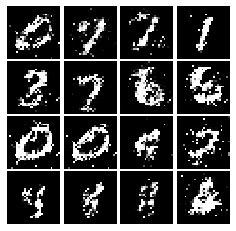

Epoch: 7, Iter: 3480, D: 0.2339, G:0.1707


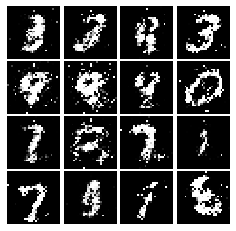

Epoch: 7, Iter: 3500, D: 0.2307, G:0.1547


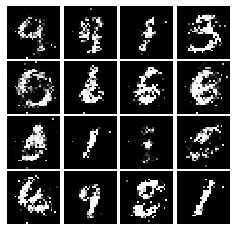

Epoch: 7, Iter: 3520, D: 0.2385, G:0.1904


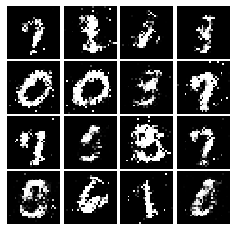

Epoch: 7, Iter: 3540, D: 0.1911, G:0.1646


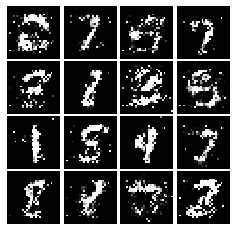

Epoch: 7, Iter: 3560, D: 0.2309, G:0.2032


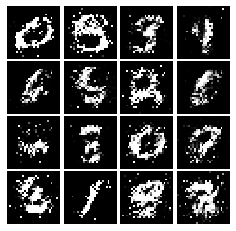

Epoch: 7, Iter: 3580, D: 0.2197, G:0.1591


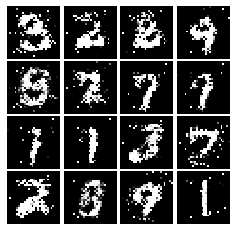

Epoch: 7, Iter: 3600, D: 0.2346, G:0.2073


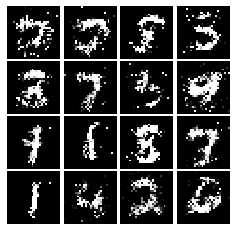

Epoch: 7, Iter: 3620, D: 0.2446, G:0.1849


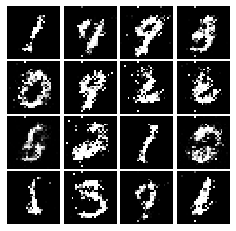

Epoch: 7, Iter: 3640, D: 0.2457, G:0.1522


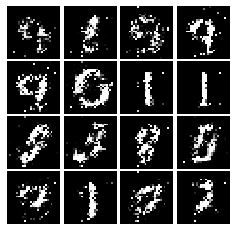

Epoch: 7, Iter: 3660, D: 0.2394, G:0.1626


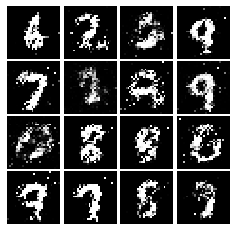

Epoch: 7, Iter: 3680, D: 0.2235, G:0.1469


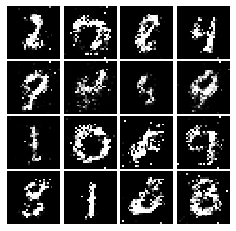

Epoch: 7, Iter: 3700, D: 0.2247, G:0.2402


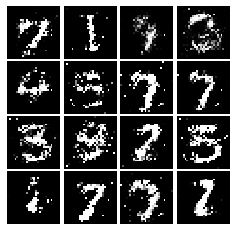

Epoch: 7, Iter: 3720, D: 0.2237, G:0.1714


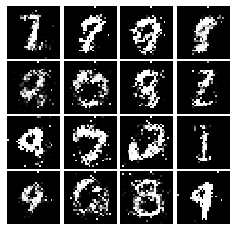

Epoch: 7, Iter: 3740, D: 0.2161, G:0.1686


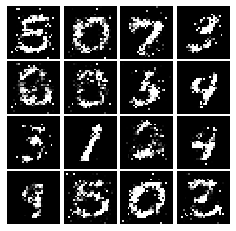

Epoch: 8, Iter: 3760, D: 0.2137, G:0.1518


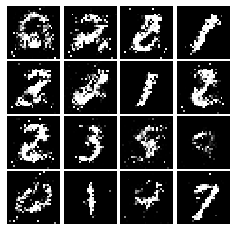

Epoch: 8, Iter: 3780, D: 0.2389, G:0.1565


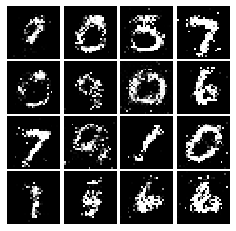

Epoch: 8, Iter: 3800, D: 0.2271, G:0.179


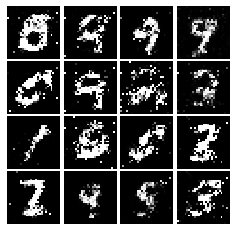

Epoch: 8, Iter: 3820, D: 0.2126, G:0.1682


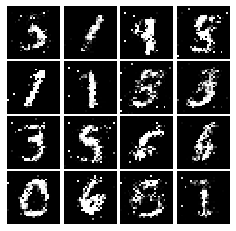

Epoch: 8, Iter: 3840, D: 0.2173, G:0.1632


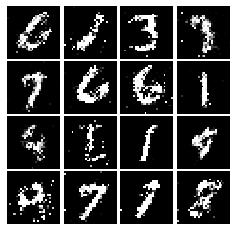

Epoch: 8, Iter: 3860, D: 0.2306, G:0.1707


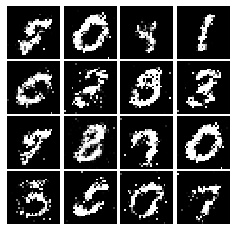

Epoch: 8, Iter: 3880, D: 0.2257, G:0.1649


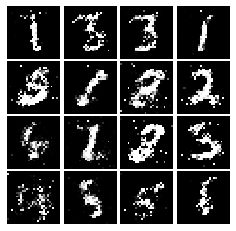

Epoch: 8, Iter: 3900, D: 0.238, G:0.1556


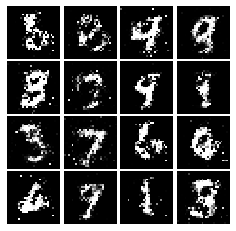

Epoch: 8, Iter: 3920, D: 0.2398, G:0.1528


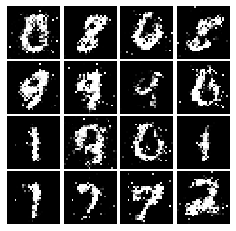

Epoch: 8, Iter: 3940, D: 0.237, G:0.1675


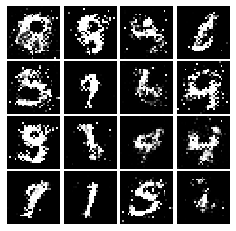

Epoch: 8, Iter: 3960, D: 0.2262, G:0.1611


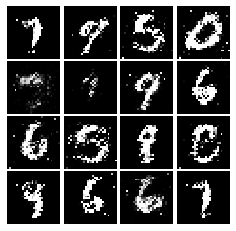

Epoch: 8, Iter: 3980, D: 0.2366, G:0.1543


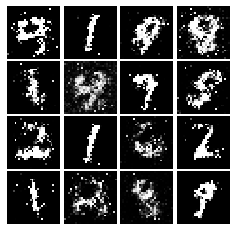

Epoch: 8, Iter: 4000, D: 0.2264, G:0.1523


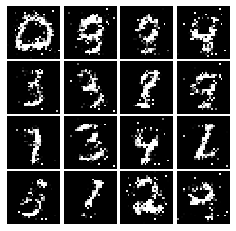

Epoch: 8, Iter: 4020, D: 0.2318, G:0.147


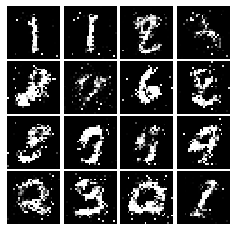

Epoch: 8, Iter: 4040, D: 0.2342, G:0.1807


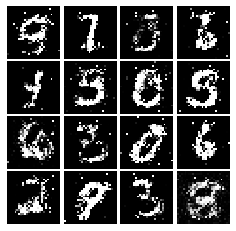

Epoch: 8, Iter: 4060, D: 0.2199, G:0.1672


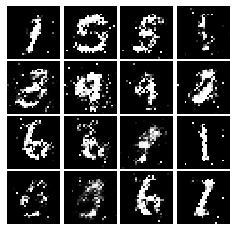

Epoch: 8, Iter: 4080, D: 0.253, G:0.1643


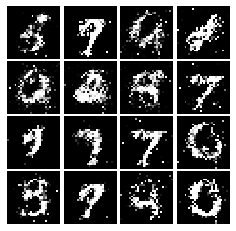

Epoch: 8, Iter: 4100, D: 0.2304, G:0.212


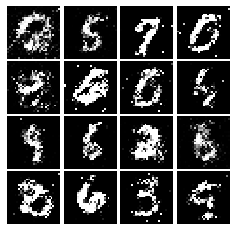

Epoch: 8, Iter: 4120, D: 0.2254, G:0.1616


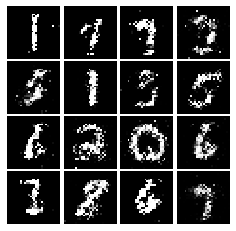

Epoch: 8, Iter: 4140, D: 0.2001, G:0.2139


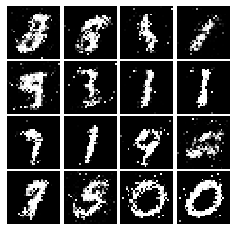

Epoch: 8, Iter: 4160, D: 0.2239, G:0.1641


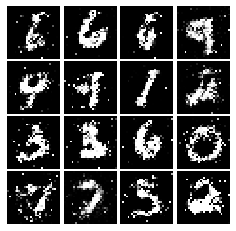

Epoch: 8, Iter: 4180, D: 0.2467, G:0.1591


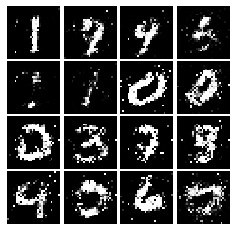

Epoch: 8, Iter: 4200, D: 0.2323, G:0.18


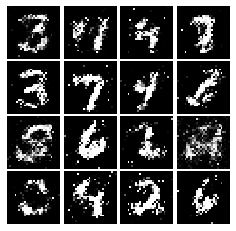

Epoch: 8, Iter: 4220, D: 0.2347, G:0.183


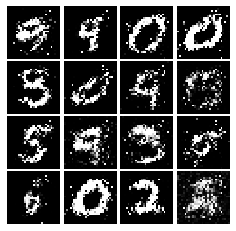

Epoch: 9, Iter: 4240, D: 0.2678, G:0.1424


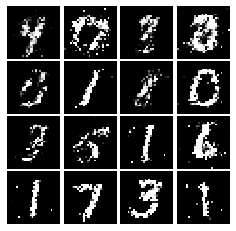

Epoch: 9, Iter: 4260, D: 0.2416, G:0.1389


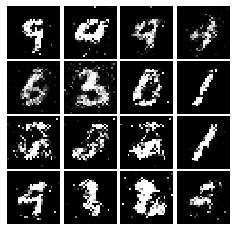

Epoch: 9, Iter: 4280, D: 0.2384, G:0.1685


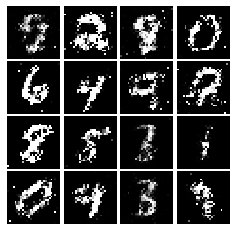

Epoch: 9, Iter: 4300, D: 0.2487, G:0.1382


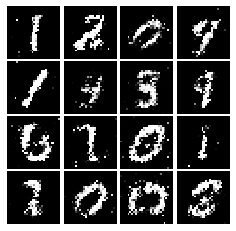

Epoch: 9, Iter: 4320, D: 0.2371, G:0.1695


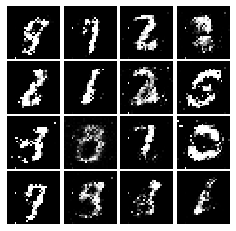

Epoch: 9, Iter: 4340, D: 0.228, G:0.1807


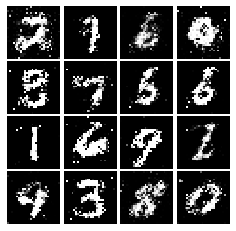

Epoch: 9, Iter: 4360, D: 0.2249, G:0.1858


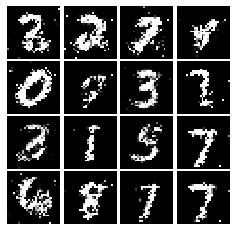

Epoch: 9, Iter: 4380, D: 0.2472, G:0.1648


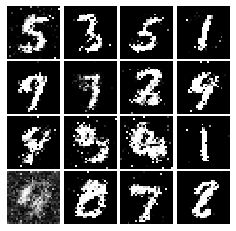

Epoch: 9, Iter: 4400, D: 0.196, G:0.2224


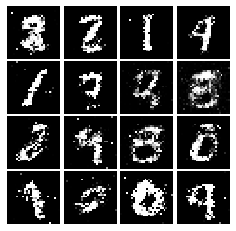

Epoch: 9, Iter: 4420, D: 0.2409, G:0.1495


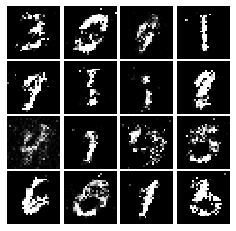

Epoch: 9, Iter: 4440, D: 0.2065, G:0.1677


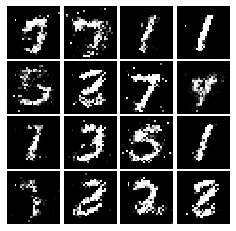

Epoch: 9, Iter: 4460, D: 0.2418, G:0.1248


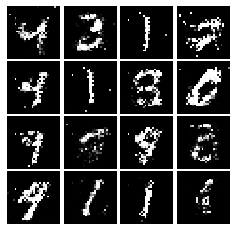

Epoch: 9, Iter: 4480, D: 0.2444, G:0.1727


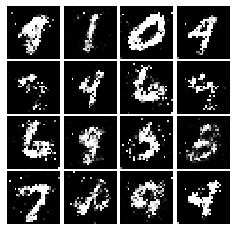

Epoch: 9, Iter: 4500, D: 0.2362, G:0.1444


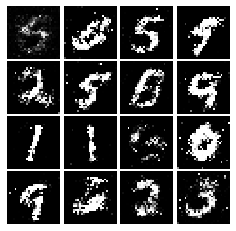

Epoch: 9, Iter: 4520, D: 0.2294, G:0.1604


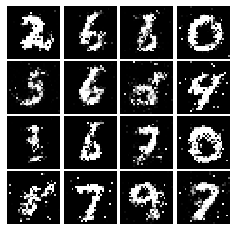

Epoch: 9, Iter: 4540, D: 0.2407, G:0.1431


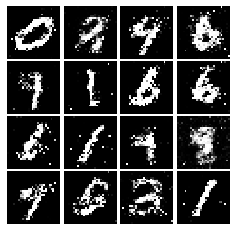

Epoch: 9, Iter: 4560, D: 0.2326, G:0.1438


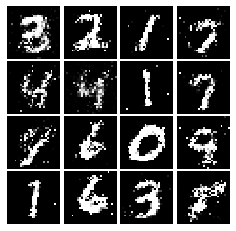

Epoch: 9, Iter: 4580, D: 0.2613, G:0.1534


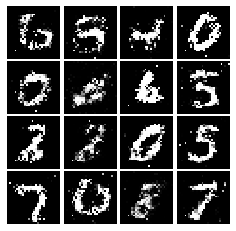

Epoch: 9, Iter: 4600, D: 0.228, G:0.1667


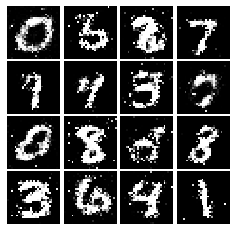

Epoch: 9, Iter: 4620, D: 0.2372, G:0.1547


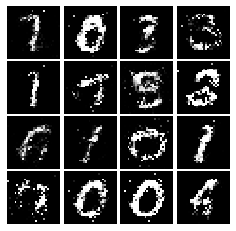

Epoch: 9, Iter: 4640, D: 0.2394, G:0.143


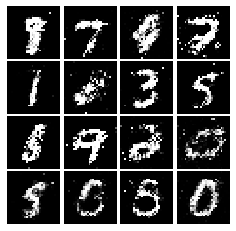

Epoch: 9, Iter: 4660, D: 0.2431, G:0.1795


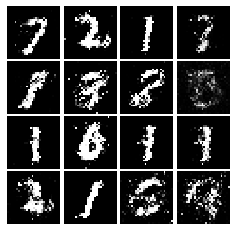

Epoch: 9, Iter: 4680, D: 0.298, G:0.1377


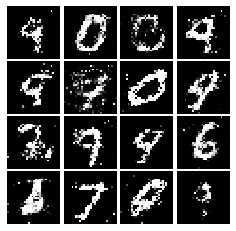

Final images


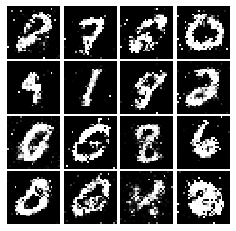

In [86]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [139]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(filters=32, kernel_size=5, activation=lambda x: leaky_relu(x, alpha=0.01)),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2),
        tf.keras.layers.Conv2D(filters=64, kernel_size=5, \
                               activation=lambda x: leaky_relu(x, alpha=0.01)),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(units=1024, activation=lambda x: leaky_relu(x, alpha=0.01)),
        tf.keras.layers.Dense(units=1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [140]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    model.add(tf.keras.layers.InputLayer(noise_dim))
    model.add(tf.keras.layers.Dense(units=1024, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(units=7 * 7 * 128, activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7, 7, 128)))
    model.add(tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=4, strides=2, padding='same', activation='relu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=4, strides=2, padding='same', activation='tanh'))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.318, G:0.6576


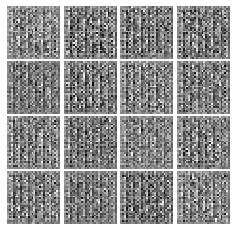

Epoch: 0, Iter: 20, D: 1.125, G:1.9


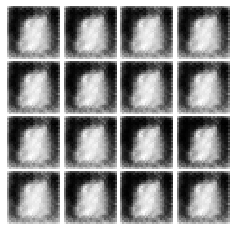

Epoch: 0, Iter: 40, D: 0.02122, G:4.154


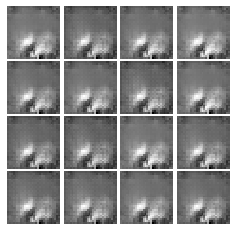

Epoch: 0, Iter: 60, D: 0.224, G:2.604


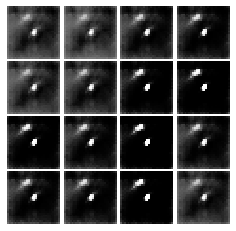

Epoch: 0, Iter: 80, D: 0.2882, G:2.458


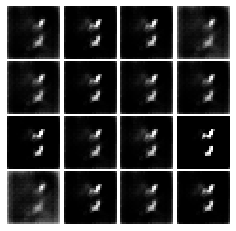

Epoch: 0, Iter: 100, D: 0.8016, G:2.861


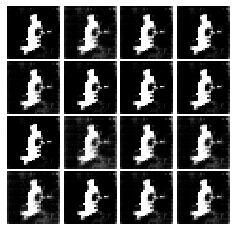

Epoch: 0, Iter: 120, D: 0.03413, G:4.871


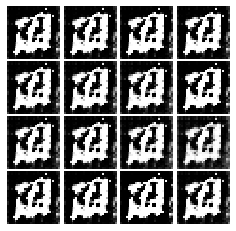

Epoch: 0, Iter: 140, D: 0.03492, G:5.088


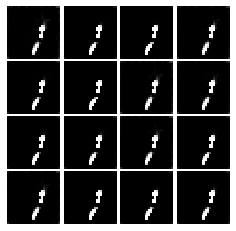

Epoch: 0, Iter: 160, D: 0.9692, G:4.951


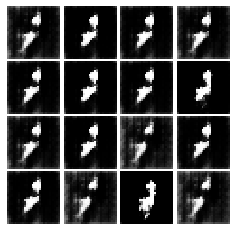

Epoch: 0, Iter: 180, D: 0.3323, G:1.886


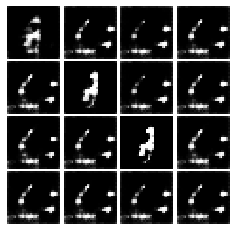

Epoch: 0, Iter: 200, D: 0.193, G:4.77


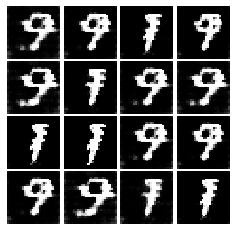

Epoch: 0, Iter: 220, D: 2.925, G:0.1355


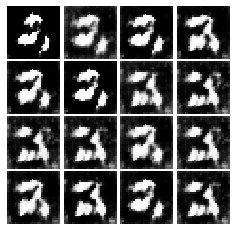

Epoch: 0, Iter: 240, D: 0.7636, G:1.832


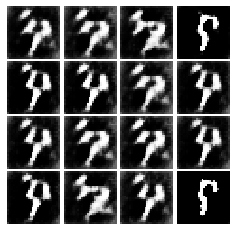

Epoch: 0, Iter: 260, D: 1.204, G:3.554


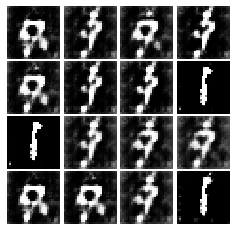

Epoch: 0, Iter: 280, D: 0.4815, G:2.643


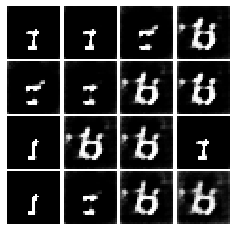

Epoch: 0, Iter: 300, D: 1.686, G:1.665


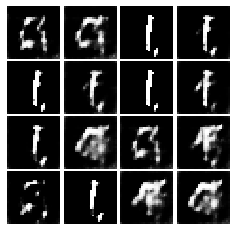

Epoch: 0, Iter: 320, D: 0.4822, G:2.072


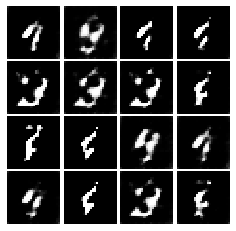

Epoch: 0, Iter: 340, D: 0.4026, G:3.241


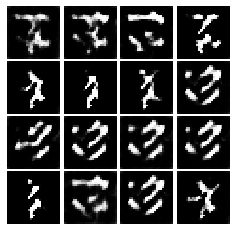

Epoch: 0, Iter: 360, D: 0.751, G:1.933


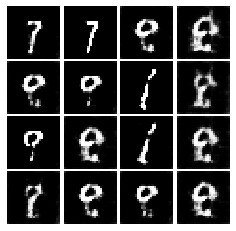

Epoch: 0, Iter: 380, D: 0.4772, G:3.38


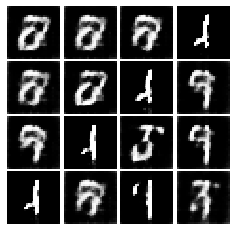

Epoch: 0, Iter: 400, D: 0.8071, G:1.858


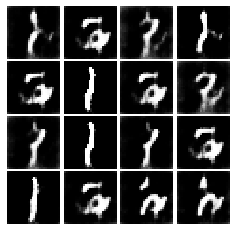

Epoch: 0, Iter: 420, D: 0.4288, G:2.049


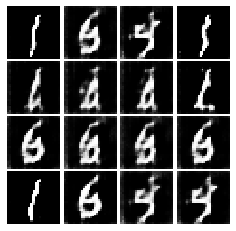

Epoch: 0, Iter: 440, D: 0.9488, G:3.029


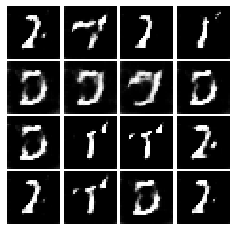

Epoch: 0, Iter: 460, D: 0.2373, G:5.207


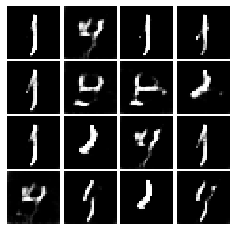

Epoch: 1, Iter: 480, D: 0.4735, G:3.029


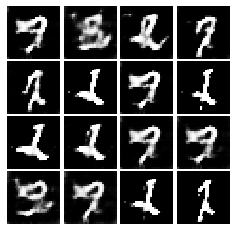

Epoch: 1, Iter: 500, D: 0.3997, G:3.539


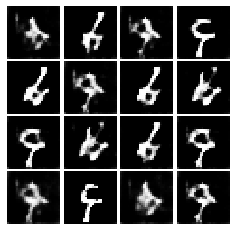

Epoch: 1, Iter: 520, D: 0.7834, G:2.737


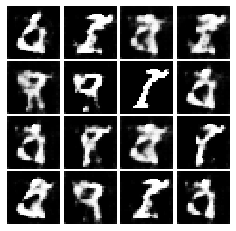

Epoch: 1, Iter: 540, D: 0.5596, G:2.517


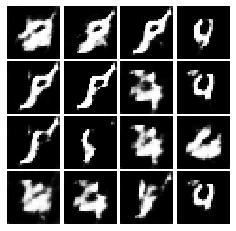

Epoch: 1, Iter: 560, D: 0.473, G:2.851


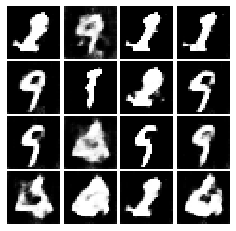

Epoch: 1, Iter: 580, D: 1.051, G:1.145


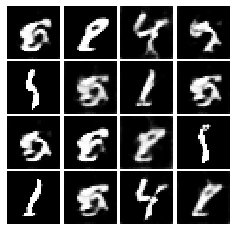

Epoch: 1, Iter: 600, D: 0.4304, G:3.14


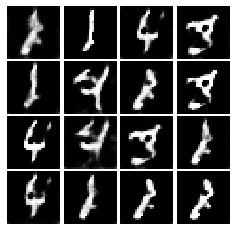

Epoch: 1, Iter: 620, D: 0.5613, G:3.22


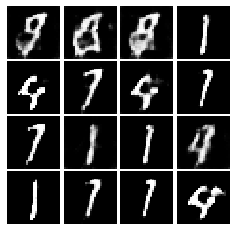

Epoch: 1, Iter: 640, D: 0.5103, G:2.983


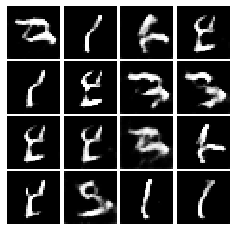

Epoch: 1, Iter: 660, D: 0.7077, G:2.587


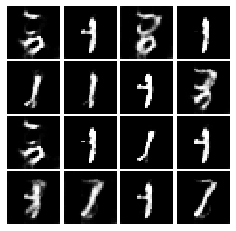

Epoch: 1, Iter: 680, D: 0.2341, G:3.258


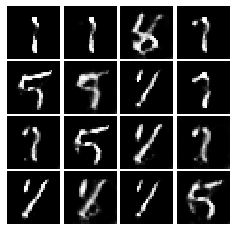

Epoch: 1, Iter: 700, D: 0.3503, G:3.176


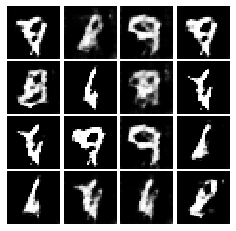

Epoch: 1, Iter: 720, D: 0.9271, G:1.313


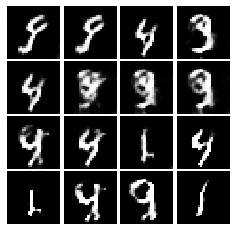

Epoch: 1, Iter: 740, D: 0.5905, G:2.569


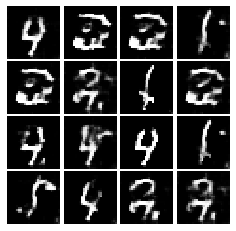

Epoch: 1, Iter: 760, D: 0.4845, G:3.423


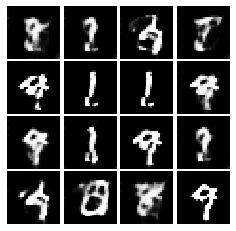

Epoch: 1, Iter: 780, D: 0.4517, G:3.162


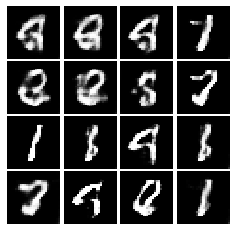

Epoch: 1, Iter: 800, D: 0.4571, G:2.784


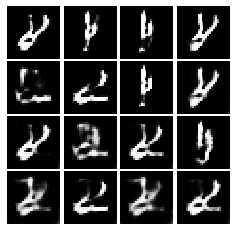

Epoch: 1, Iter: 820, D: 0.5419, G:2.738


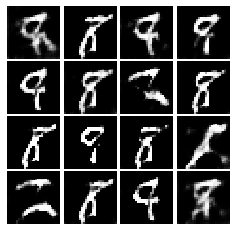

Epoch: 1, Iter: 840, D: 0.477, G:2.355


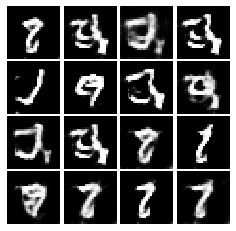

Epoch: 1, Iter: 860, D: 0.4767, G:2.163


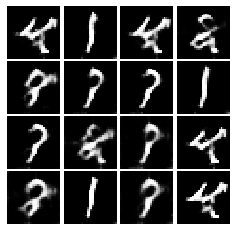

Epoch: 1, Iter: 880, D: 0.4652, G:5.375


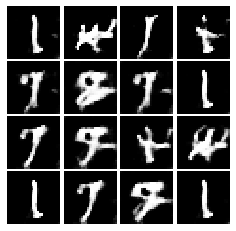

Epoch: 1, Iter: 900, D: 0.4762, G:2.49


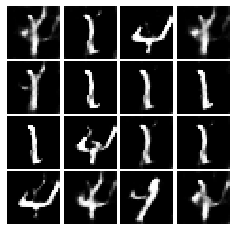

Epoch: 1, Iter: 920, D: 0.3968, G:2.256


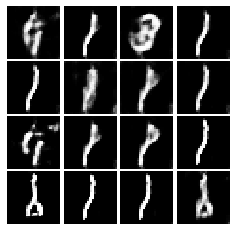

Epoch: 2, Iter: 940, D: 0.4803, G:3.741


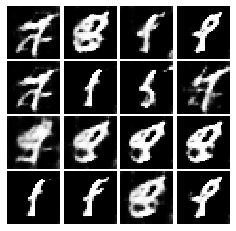

Epoch: 2, Iter: 960, D: 0.6308, G:1.806


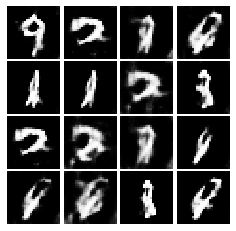

Epoch: 2, Iter: 980, D: 0.4599, G:2.43


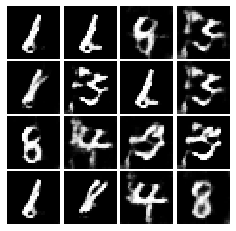

Epoch: 2, Iter: 1000, D: 0.6072, G:2.527


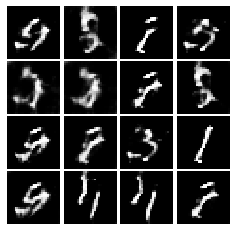

Epoch: 2, Iter: 1020, D: 0.3052, G:2.98


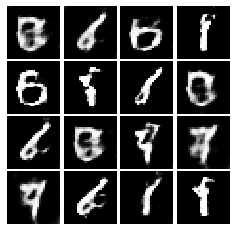

Epoch: 2, Iter: 1040, D: 0.5347, G:2.815


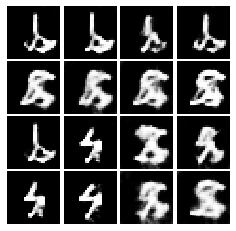

Epoch: 2, Iter: 1060, D: 0.4563, G:2.697


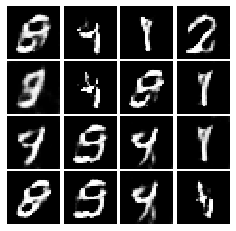

Epoch: 2, Iter: 1080, D: 0.4775, G:1.897


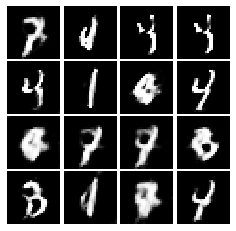

Epoch: 2, Iter: 1100, D: 0.3617, G:3.499


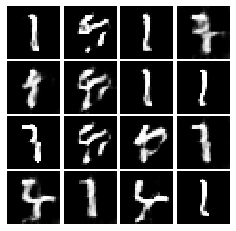

Epoch: 2, Iter: 1120, D: 0.3659, G:3.055


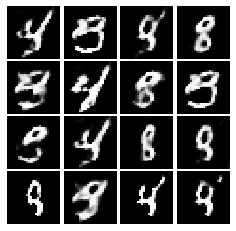

Epoch: 2, Iter: 1140, D: 0.4263, G:5.61


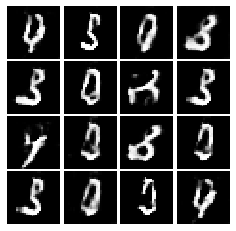

Epoch: 2, Iter: 1160, D: 0.5015, G:3.425


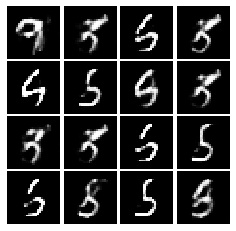

Epoch: 2, Iter: 1180, D: 0.4718, G:3.377


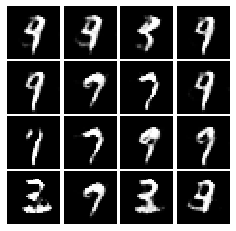

Epoch: 2, Iter: 1200, D: 0.5344, G:3.522


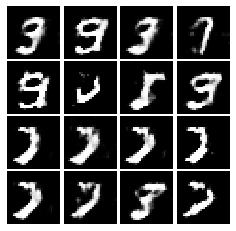

Epoch: 2, Iter: 1220, D: 0.7629, G:2.433


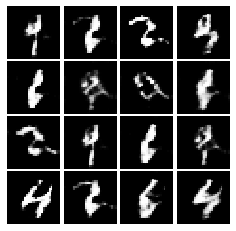

Epoch: 2, Iter: 1240, D: 0.2291, G:2.935


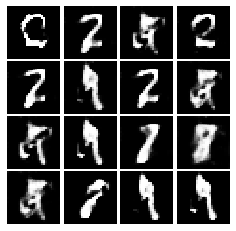

Epoch: 2, Iter: 1260, D: 0.4325, G:2.592


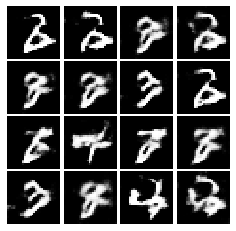

Epoch: 2, Iter: 1280, D: 0.5538, G:2.245


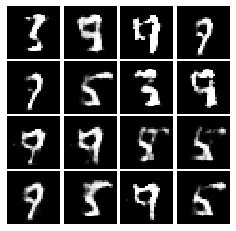

Epoch: 2, Iter: 1300, D: 0.3508, G:3.3


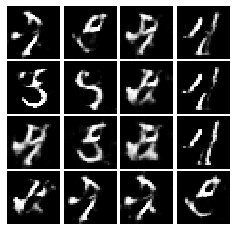

Epoch: 2, Iter: 1320, D: 0.4742, G:2.596


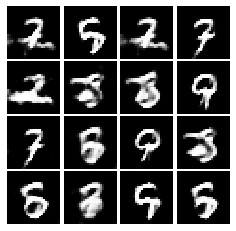

Epoch: 2, Iter: 1340, D: 0.4764, G:2.722


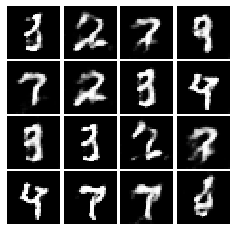

Epoch: 2, Iter: 1360, D: 0.5125, G:3.356


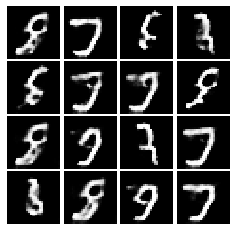

Epoch: 2, Iter: 1380, D: 0.4548, G:3.497


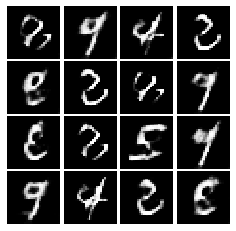

Epoch: 2, Iter: 1400, D: 0.4209, G:2.557


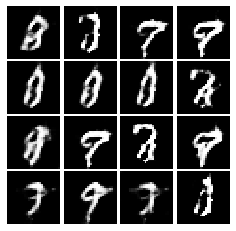

Epoch: 3, Iter: 1420, D: 0.2858, G:4.297


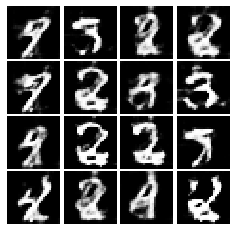

Epoch: 3, Iter: 1440, D: 0.3167, G:3.937


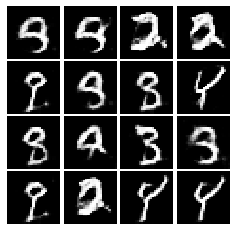

Epoch: 3, Iter: 1460, D: 0.6135, G:3.434


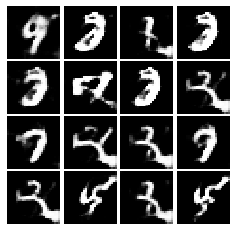

Epoch: 3, Iter: 1480, D: 0.3837, G:3.897


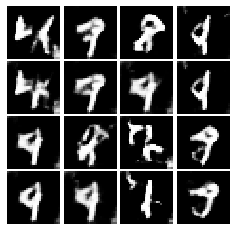

Epoch: 3, Iter: 1500, D: 0.5511, G:3.59


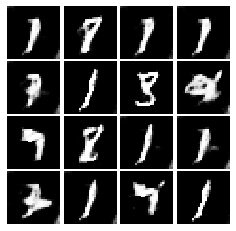

Epoch: 3, Iter: 1520, D: 0.3947, G:2.603


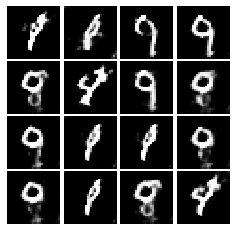

Epoch: 3, Iter: 1540, D: 0.236, G:3.757


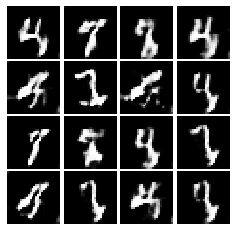

Epoch: 3, Iter: 1560, D: 0.6149, G:2.498


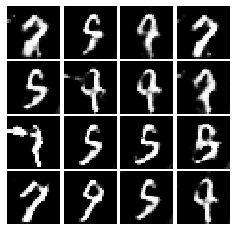

Epoch: 3, Iter: 1580, D: 0.2865, G:2.911


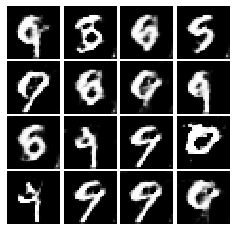

Epoch: 3, Iter: 1600, D: 0.4372, G:3.078


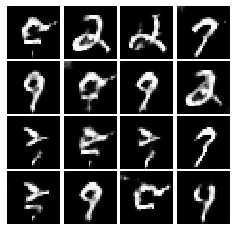

Epoch: 3, Iter: 1620, D: 0.5031, G:5.141


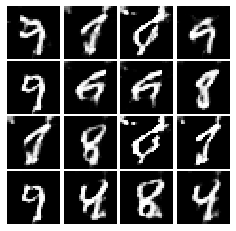

Epoch: 3, Iter: 1640, D: 0.4111, G:4.259


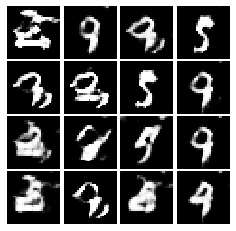

Epoch: 3, Iter: 1660, D: 0.4293, G:2.882


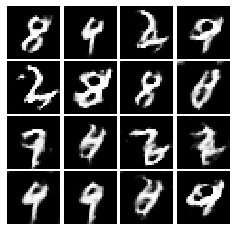

Epoch: 3, Iter: 1680, D: 0.5513, G:3.349


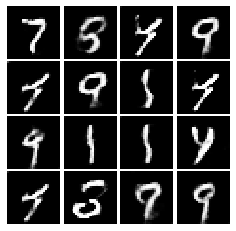

Epoch: 3, Iter: 1700, D: 0.1773, G:4.331


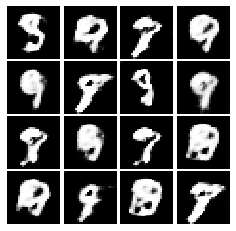

Epoch: 3, Iter: 1720, D: 0.4735, G:3.184


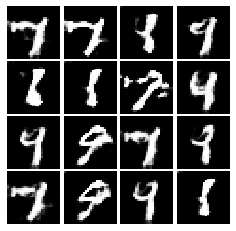

Epoch: 3, Iter: 1740, D: 0.9067, G:3.404


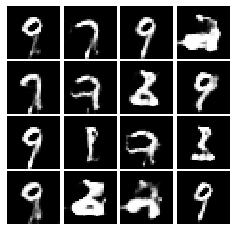

Epoch: 3, Iter: 1760, D: 0.2986, G:3.47


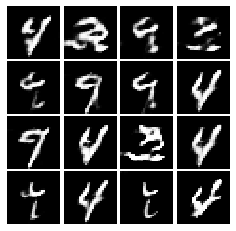

Epoch: 3, Iter: 1780, D: 0.3527, G:3.712


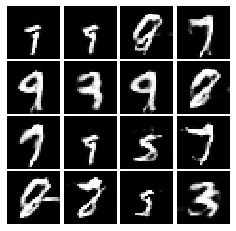

Epoch: 3, Iter: 1800, D: 0.3558, G:3.345


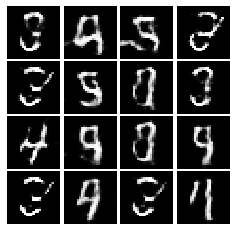

Epoch: 3, Iter: 1820, D: 0.3747, G:2.534


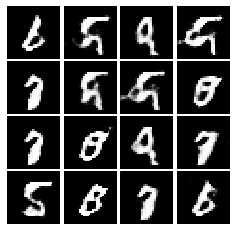

Epoch: 3, Iter: 1840, D: 0.3477, G:2.64


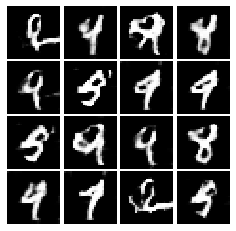

Epoch: 3, Iter: 1860, D: 0.3194, G:2.652


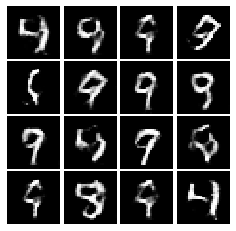

Epoch: 4, Iter: 1880, D: 0.2326, G:3.266


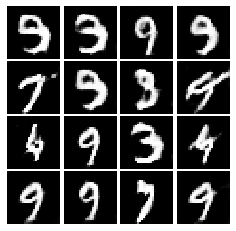

Epoch: 4, Iter: 1900, D: 0.3661, G:2.823


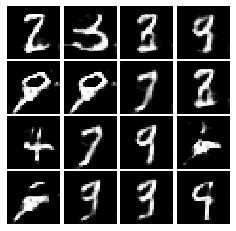

Epoch: 4, Iter: 1920, D: 0.2701, G:4.001


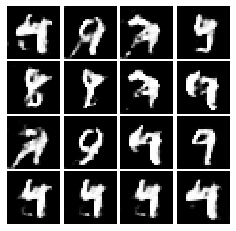

Epoch: 4, Iter: 1940, D: 0.3888, G:3.631


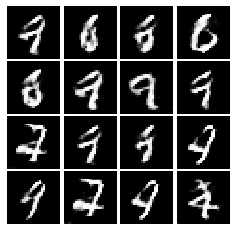

Epoch: 4, Iter: 1960, D: 0.3296, G:3.092


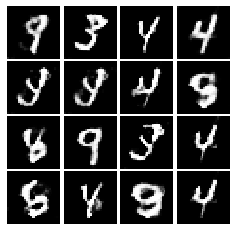

Epoch: 4, Iter: 1980, D: 0.1977, G:3.575


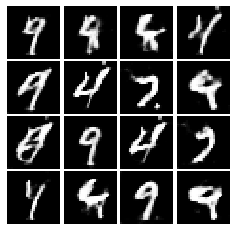

Epoch: 4, Iter: 2000, D: 0.3896, G:2.349


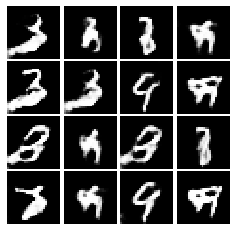

Epoch: 4, Iter: 2020, D: 0.3489, G:3.394


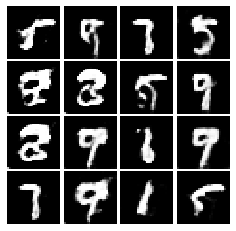

Epoch: 4, Iter: 2040, D: 0.297, G:3.271


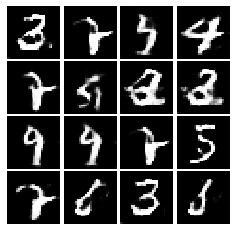

Epoch: 4, Iter: 2060, D: 0.2612, G:3.392


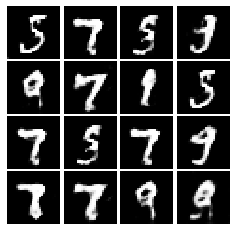

Epoch: 4, Iter: 2080, D: 0.7541, G:2.46


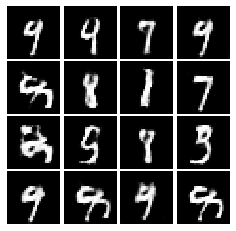

Epoch: 4, Iter: 2100, D: 0.415, G:2.875


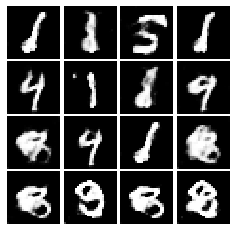

Epoch: 4, Iter: 2120, D: 0.3505, G:2.999


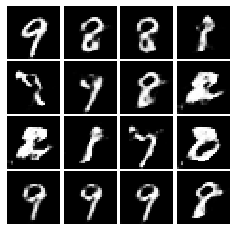

Epoch: 4, Iter: 2140, D: 0.5283, G:3.062


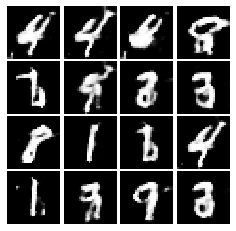

Epoch: 4, Iter: 2160, D: 0.4745, G:2.836


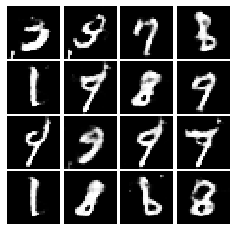

Epoch: 4, Iter: 2180, D: 0.4365, G:3.04


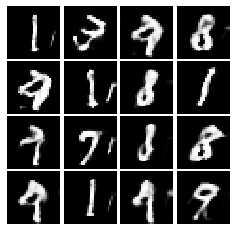

Epoch: 4, Iter: 2200, D: 0.7463, G:2.57


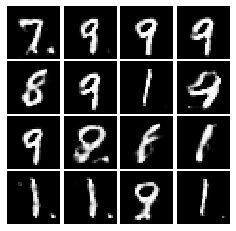

Epoch: 4, Iter: 2220, D: 0.3103, G:2.21


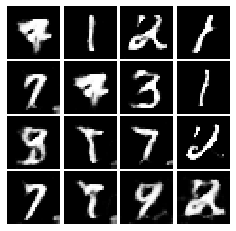

Epoch: 4, Iter: 2240, D: 0.4207, G:2.511


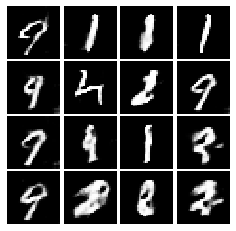

Epoch: 4, Iter: 2260, D: 0.5127, G:2.451


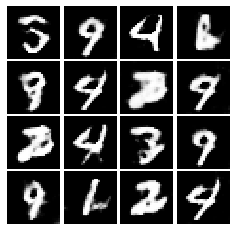

Epoch: 4, Iter: 2280, D: 0.3914, G:2.479


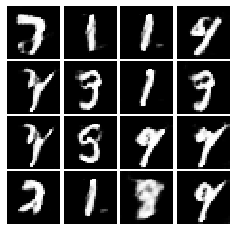

Epoch: 4, Iter: 2300, D: 0.4308, G:2.505


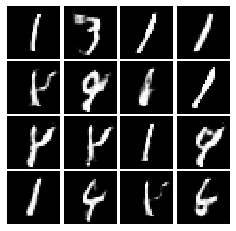

Epoch: 4, Iter: 2320, D: 0.3903, G:2.643


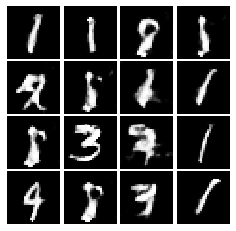

Epoch: 4, Iter: 2340, D: 0.7432, G:2.787


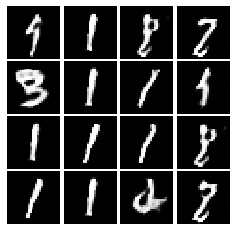

Final images


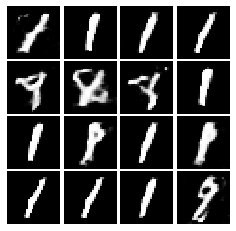

In [141]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

# INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
$\min_x\max_y f(x,y)$ evaluates gradients that need to be applied to x to minimize f and to y to maximize it
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   |  -1   |   1   
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |  -1   |   1   |   2   |   1   
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
No, since as we see from the table traning process come back to the initial state in 6 turns.


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
No, since discriminator loss consists from negative generator loss and true images loss. And when generator loss decreases and discriminator loss stays the same means that true images loss increases.